## Modélisation du SWI Uniforme

In [48]:
import pandas as pd

data = pd.read_csv("../data/data_cleaned.csv", sep=",")
data.head()

C:\Users\USER\AppData\Local\Temp\ipykernel_10932\619631920.py:3: DtypeWarning: Columns (6,10) have mixed types. Specify dtype option on import or set low_memory=False.
  data = pd.read_csv("../data/data_cleaned.csv", sep=",")


,NUMERO,LAMBX_93,LAMBY_93,LAMBX_2,LAMBY_2,ANNEE,code_insee_commune,commune,code_insee_de_la_region,region,...,WG_RACINE_03,WG_RACINE_04,WG_RACINE_05,WG_RACINE_06,WG_RACINE_07,WG_RACINE_08,WG_RACINE_09,WG_RACINE_10,WG_RACINE_11,WG_RACINE_12
0,1860,111467,6838785,60000,2401000,2000,29084,Île-Molène,53,Bretagne,...,0.30,0.30,0.30,0.29,0.28,0.26,0.25,0.28,0.31,0.32
1,2477,127137,6798687,76000,2361000,2000,29168,Plogoff,53,Bretagne,...,0.23,0.24,0.23,0.22,0.19,0.18,0.18,0.21,0.25,0.27
2,1984,127392,6830663,76000,2393000,2000,29190,Plougonvelin,53,Bretagne,...,0.29,0.29,0.29,0.27,0.25,0.23,0.23,0.26,0.30,0.32
3,1861,127455,6838657,76000,2401000,2000,29201,Ploumoguer,53,Bretagne,...,0.30,0.31,0.30,0.29,0.27,0.25,0.24,0.28,0.32,0.33
4,1737,127519,6846652,76000,2409000,2000,29098,Lampaul-Plouarzel,53,Bretagne,...,0.30,0.31,0.30,0.29,0.27,0.24,0.24,0.28,0.32,0.33


In [2]:
print(data.columns.tolist())

['NUMERO', 'LAMBX_93', 'LAMBY_93', 'LAMBX_2', 'LAMBY_2', 'ANNEE', 'code_insee_commune', 'commune', 'code_insee_de_la_region', 'region', 'code_insee_departement', 'departement', 'argile_niveau', 'swi_unif_01', 'swi_unif_02', 'swi_unif_03', 'swi_unif_04', 'swi_unif_05', 'swi_unif_06', 'swi_unif_07', 'swi_unif_08', 'swi_unif_09', 'swi_unif_10', 'swi_unif_11', 'swi_unif_12', 'SWI_01', 'SWI_02', 'SWI_03', 'SWI_04', 'SWI_05', 'SWI_06', 'SWI_07', 'SWI_08', 'SWI_09', 'SWI_10', 'SWI_11', 'SWI_12', 'DLI_01', 'DLI_02', 'DLI_03', 'DLI_04', 'DLI_05', 'DLI_06', 'DLI_07', 'DLI_08', 'DLI_09', 'DLI_10', 'DLI_11', 'DLI_12', 'DRAINC_01', 'DRAINC_02', 'DRAINC_03', 'DRAINC_04', 'DRAINC_05', 'DRAINC_06', 'DRAINC_07', 'DRAINC_08', 'DRAINC_09', 'DRAINC_10', 'DRAINC_11', 'DRAINC_12', 'ECOULEMENT_01', 'ECOULEMENT_02', 'ECOULEMENT_03', 'ECOULEMENT_04', 'ECOULEMENT_05', 'ECOULEMENT_06', 'ECOULEMENT_07', 'ECOULEMENT_08', 'ECOULEMENT_09', 'ECOULEMENT_10', 'ECOULEMENT_11', 'ECOULEMENT_12', 'ETP_01', 'ETP_02', 'ETP_0

In [3]:
import pandas as pd

# Colonnes à décaler
SWI_UNIF_COLS = [f"swi_unif_{m:02d}" for m in range(1, 13)]
SWI_COLS      = [f"SWI_{m:02d}" for m in range(1, 13)]
SHIFT_COLS = SWI_UNIF_COLS + SWI_COLS

# 1) Trier correctement
df = data.sort_values(["NUMERO", "ANNEE"]).reset_index(drop=True)

# 2) Création des lags (1 à 10 ans)
for col in SHIFT_COLS:
    for lag in range(1, 12):
        df[f"{col}_lag{lag}"] = (
            df.groupby("NUMERO")[col]
              .shift(lag)
        )

# 3) Garder uniquement 2010–2024
df1 = df[df["ANNEE"].between(2009, 2024)].copy()

# 4) (Optionnel mais recommandé) Supprimer les lignes avec lags manquants
df1 = df1.dropna(subset=[f"{col}_lag10" for col in SHIFT_COLS])

C:\Users\USER\AppData\Local\Temp\ipykernel_27972\41408914.py:14: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df[f"{col}_lag{lag}"] = (
C:\Users\USER\AppData\Local\Temp\ipykernel_27972\41408914.py:14: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df[f"{col}_lag{lag}"] = (
C:\Users\USER\AppData\Local\Temp\ipykernel_27972\41408914.py:14: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.co

In [4]:
df1.head()

,NUMERO,LAMBX_93,LAMBY_93,LAMBX_2,LAMBY_2,ANNEE,code_insee_commune,commune,code_insee_de_la_region,region,...,SWI_12_lag2,SWI_12_lag3,SWI_12_lag4,SWI_12_lag5,SWI_12_lag6,SWI_12_lag7,SWI_12_lag8,SWI_12_lag9,SWI_12_lag10,SWI_12_lag11
10,2,641374,7106309,588000,2673000,2010,59273,Gravelines,32,Hauts-de-France,...,0.75,0.84,0.93,0.86,0.68,0.70,0.90,0.91,0.99,NaN
11,2,641374,7106309,588000,2673000,2011,59273,Gravelines,32,Hauts-de-France,...,1.01,0.75,0.84,0.93,0.86,0.68,0.70,0.90,0.91,0.99
12,2,641374,7106309,588000,2673000,2012,59273,Gravelines,32,Hauts-de-France,...,0.89,1.01,0.75,0.84,0.93,0.86,0.68,0.70,0.90,0.91
13,2,641374,7106309,588000,2673000,2013,59273,Gravelines,32,Hauts-de-France,...,0.74,0.89,1.01,0.75,0.84,0.93,0.86,0.68,0.70,0.90
14,2,641374,7106309,588000,2673000,2014,59273,Gravelines,32,Hauts-de-France,...,1.04,0.74,0.89,1.01,0.75,0.84,0.93,0.86,0.68,0.70


In [5]:
print(df1.columns.tolist())

['NUMERO', 'LAMBX_93', 'LAMBY_93', 'LAMBX_2', 'LAMBY_2', 'ANNEE', 'code_insee_commune', 'commune', 'code_insee_de_la_region', 'region', 'code_insee_departement', 'departement', 'argile_niveau', 'swi_unif_01', 'swi_unif_02', 'swi_unif_03', 'swi_unif_04', 'swi_unif_05', 'swi_unif_06', 'swi_unif_07', 'swi_unif_08', 'swi_unif_09', 'swi_unif_10', 'swi_unif_11', 'swi_unif_12', 'SWI_01', 'SWI_02', 'SWI_03', 'SWI_04', 'SWI_05', 'SWI_06', 'SWI_07', 'SWI_08', 'SWI_09', 'SWI_10', 'SWI_11', 'SWI_12', 'DLI_01', 'DLI_02', 'DLI_03', 'DLI_04', 'DLI_05', 'DLI_06', 'DLI_07', 'DLI_08', 'DLI_09', 'DLI_10', 'DLI_11', 'DLI_12', 'DRAINC_01', 'DRAINC_02', 'DRAINC_03', 'DRAINC_04', 'DRAINC_05', 'DRAINC_06', 'DRAINC_07', 'DRAINC_08', 'DRAINC_09', 'DRAINC_10', 'DRAINC_11', 'DRAINC_12', 'ECOULEMENT_01', 'ECOULEMENT_02', 'ECOULEMENT_03', 'ECOULEMENT_04', 'ECOULEMENT_05', 'ECOULEMENT_06', 'ECOULEMENT_07', 'ECOULEMENT_08', 'ECOULEMENT_09', 'ECOULEMENT_10', 'ECOULEMENT_11', 'ECOULEMENT_12', 'ETP_01', 'ETP_02', 'ETP_0

# Regression linéaire

ON ESSAIE D' AVOIR UN H OPTIMAL POUR LE SWI ET UN H UNIFORME POUR LE SWI UNIFORME

In [6]:
def build_X_pair(df, h_unif, h_swi):
    cols = []

    # Lags de swi_unif
    for k in range(1, h_unif + 1):
        cols += [f"swi_unif_{m:02d}_lag{k}" for m in range(1, 13)]

    # Lags de SWI
    for k in range(1, h_swi + 1):
        cols += [f"SWI_{m:02d}_lag{k}" for m in range(1, 13)]

    return df[cols]


In [7]:
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, mean_absolute_error
import numpy as np

def score_for_pair(df_train, df_val, h_unif, h_swi):
    X_train = build_X_pair(df_train, h_unif, h_swi)
    X_val   = build_X_pair(df_val, h_unif, h_swi)

    rmses = []
    maes  = []

    for m in range(1, 13):
        y_train = df_train[f"swi_unif_{m:02d}"]
        y_val   = df_val[f"swi_unif_{m:02d}"]

        model = LinearRegression()
        model.fit(X_train, y_train)

        y_pred = model.predict(X_val)

        rmses.append(np.sqrt(mean_squared_error(y_val, y_pred)))
        maes.append(mean_absolute_error(y_val, y_pred))

    return np.mean(rmses), np.mean(maes)


In [8]:
df_train = df1[df1["ANNEE"] <= 2019].copy()
df_val  = df1[df1["ANNEE"] >= 2020].copy()

In [ ]:
H_MAX = 10

results = []

for h_unif in range(1, H_MAX + 1):
    for h_swi in range(1, H_MAX + 1):

        rmse, mae = score_for_pair(df_train, df_val, h_unif, h_swi)

        results.append({
            "h_swi_unif": h_unif,
            "h_swi": h_swi,
            "RMSE": rmse,
            "MAE": mae
        })

results_df = pd.DataFrame(results)


In [14]:
best_mae = results_df.loc[results_df["MAE"].idxmin()]
best_mae

h_swi_unif    6.000000
h_swi         3.000000
RMSE          0.180803
MAE           0.143104
Name: 52, dtype: float64

In [16]:
best_rmse = results_df.loc[results_df["RMSE"].idxmin()]
best_rmse

h_swi_unif     5.000000
h_swi         10.000000
RMSE           0.179464
MAE            0.143367
Name: 49, dtype: float64

# ENTRAINNEMENT DU MODELE AVEC  LES PAIRES DE PARAMETRES OPTIMAUX OBTENUS

### 1) Sélection des variables à utiliser

In [9]:
OTHER_VARS = [
    "code_insee_de_la_region",
    "code_insee_departement",
    "argile_niveau",

    *[f"DLI_{m:02d}" for m in range(1,13)],
    *[f"DRAINC_{m:02d}" for m in range(1,13)],
    *[f"ECOULEMENT_{m:02d}" for m in range(1,13)],
    *[f"EVAP_{m:02d}" for m in range(2,13)],
    *[f"FF_{m:02d}" for m in range(1,13)],
    *[f"HTEURNEIGE_{m:02d}" for m in range(1,13)],
    *[f"HU_{m:02d}" for m in range(1,13)],
    *[f"PE_{m:02d}" for m in range(1,13)],
    *[f"PRELIQ_{m:02d}" for m in range(1,13)],
    *[f"PRENEI_{m:02d}" for m in range(1,13)],
    *[f"Q_{m:02d}" for m in range(1,13)],
    *[f"RESR_NEIGE_{m:02d}" for m in range(1,13)],
    *[f"RUNC_{m:02d}" for m in range(1,13)],
    *[f"SNOW_FRAC_{m:02d}" for m in range(1,13)],
    *[f"SSI_{m:02d}" for m in range(1,13)],
    *[f"SSWI_10J_{m:02d}" for m in range(1,13)],
    *[f"T_{m:02d}" for m in range(1,13)],
    *[f"WGI_RACINE_{m:02d}" for m in range(1,13)],
    *[f"WG_RACINE_{m:02d}" for m in range(1,13)],
]


In [10]:
df1 = df1.sort_values(["NUMERO", "ANNEE"]).reset_index(drop=True)

for col in OTHER_VARS:
    if col in df1.columns:
        df1[f"{col}_lag1"] = df1.groupby("NUMERO")[col].shift(1)


C:\Users\USER\AppData\Local\Temp\ipykernel_27972\2820742523.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df1[f"{col}_lag1"] = df1.groupby("NUMERO")[col].shift(1)
C:\Users\USER\AppData\Local\Temp\ipykernel_27972\2820742523.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df1[f"{col}_lag1"] = df1.groupby("NUMERO")[col].shift(1)
C:\Users\USER\AppData\Local\Temp\ipykernel_27972\2820742523.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has po

#### 2) Shift d'ordre 1 des autres variables

In [11]:
lag1_cols = [f"{v}_lag1" for v in OTHER_VARS if f"{v}_lag1" in df1.columns]
df1 = df1.dropna(subset=lag1_cols)


#### 3) Implémentation de quelques fonctions

In [12]:
def build_X_final(df, h_unif, h_swi):
    cols = []

    # swi_unif lags
    for k in range(1, h_unif + 1):
        cols += [f"swi_unif_{m:02d}_lag{k}" for m in range(1, 13)]

    # SWI lags
    for k in range(1, h_swi + 1):
        cols += [f"SWI_{m:02d}_lag{k}" for m in range(1, 13)]

    # autres variables (lag 1)
    cols += [f"{v}_lag1" for v in OTHER_VARS if f"{v}_lag1" in df.columns]

    return df[cols]


## I) Modèle de Regression Linéaire

### 1) Modèles séparés (un modèle par mois)

#### 1.1) Modèle RL avec la paire qui minimise la MAE

In [23]:
import numpy as np
import pandas as pd
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, mean_absolute_error

# Construction de X
X_train = build_X_final(df_train, 6, 3)
X_test  = build_X_final(df_val, 6, 3)

# 🔧 CORRECTION DÉFINITIVE : normalisation des départements corses
#for dfX in [X_train, X_test]:
    #dfX["code_insee_departement_lag1"] = (
        #dfX["code_insee_departement_lag1"]
        #.replace({"2A": "20", "2B": "20"})
        #.astype(int)
    #)

models = {}
metrics = {}

for m in range(1, 13):
    y_train = df_train[f"swi_unif_{m:02d}"].astype(float)
    y_test  = df_val[f"swi_unif_{m:02d}"].astype(float)

    model = LinearRegression()
    model.fit(X_train, y_train)

    y_pred = model.predict(X_test)

    rmse = np.sqrt(mean_squared_error(y_test, y_pred))
    mae  = mean_absolute_error(y_test, y_pred)

    models[m] = model
    metrics[m] = {"rmse": rmse, "mae": mae}

    print(f"Mois {m:02d} | RMSE={rmse:.4f} | MAE={mae:.4f}")


Mois 01 | RMSE=0.0796 | MAE=0.0628
Mois 02 | RMSE=0.1274 | MAE=0.1000
Mois 03 | RMSE=0.1210 | MAE=0.0931
Mois 04 | RMSE=0.1434 | MAE=0.1100
Mois 05 | RMSE=0.1953 | MAE=0.1574
Mois 06 | RMSE=0.2544 | MAE=0.2049
Mois 07 | RMSE=0.2485 | MAE=0.2053
Mois 08 | RMSE=0.1899 | MAE=0.1461
Mois 09 | RMSE=0.1580 | MAE=0.1235
Mois 10 | RMSE=0.2608 | MAE=0.2052
Mois 11 | RMSE=0.2175 | MAE=0.1729
Mois 12 | RMSE=0.1737 | MAE=0.1361


In [24]:
rmse_global = np.mean([v["rmse"] for v in metrics.values()])
mae_global  = np.mean([v["mae"]  for v in metrics.values()])

print("\n=== PERFORMANCE GLOBALE ===")
print(f"RMSE moyenne (12 mois) = {rmse_global:.4f}")
print(f"MAE  moyenne (12 mois) = {mae_global:.4f}")



=== PERFORMANCE GLOBALE ===
RMSE moyenne (12 mois) = 0.1808
MAE  moyenne (12 mois) = 0.1431


#### 1.2) MODELE AVEC LE COUPLE DE H QUI MINIMISAIT LA RMSE

In [26]:
import numpy as np
import pandas as pd
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, mean_absolute_error

# Construction de X
X_train = build_X_final(df_train, 5, 10)
X_test  = build_X_final(df_val, 5, 10)

# 🔧 CORRECTION DÉFINITIVE : normalisation des départements corses
#for dfX in [X_train, X_test]:
    #dfX["code_insee_departement_lag1"] = (
        #dfX["code_insee_departement_lag1"]
        #.replace({"2A": "20", "2B": "20"})
        #.astype(int)
    #)

models = {}
metrics = {}

for m in range(1, 13):
    y_train = df_train[f"swi_unif_{m:02d}"].astype(float)
    y_test  = df_val[f"swi_unif_{m:02d}"].astype(float)

    model = LinearRegression()
    model.fit(X_train, y_train)

    y_pred = model.predict(X_test)

    rmse = np.sqrt(mean_squared_error(y_test, y_pred))
    mae  = mean_absolute_error(y_test, y_pred)

    models[m] = model
    metrics[m] = {"rmse": rmse, "mae": mae}

    print(f"Mois {m:02d} | RMSE={rmse:.4f} | MAE={mae:.4f}")


Mois 01 | RMSE=0.0772 | MAE=0.0606
Mois 02 | RMSE=0.1243 | MAE=0.0971
Mois 03 | RMSE=0.1099 | MAE=0.0806
Mois 04 | RMSE=0.1500 | MAE=0.1176
Mois 05 | RMSE=0.1904 | MAE=0.1603
Mois 06 | RMSE=0.2567 | MAE=0.2089
Mois 07 | RMSE=0.2560 | MAE=0.2123
Mois 08 | RMSE=0.1776 | MAE=0.1420
Mois 09 | RMSE=0.1557 | MAE=0.1206
Mois 10 | RMSE=0.2446 | MAE=0.1923
Mois 11 | RMSE=0.2173 | MAE=0.1732
Mois 12 | RMSE=0.1939 | MAE=0.1549


In [27]:
rmse_global = np.mean([v["rmse"] for v in metrics.values()])
mae_global  = np.mean([v["mae"]  for v in metrics.values()])

print("\n=== PERFORMANCE GLOBALE ===")
print(f"RMSE moyenne (12 mois) = {rmse_global:.4f}")
print(f"MAE  moyenne (12 mois) = {mae_global:.4f}")



=== PERFORMANCE GLOBALE ===
RMSE moyenne (12 mois) = 0.1795
MAE  moyenne (12 mois) = 0.1434


### 2) Modèle MULTI OUPUTS (Modèle qui renvoie le vecteur)

#### 2.1) Quelques fonctions

In [13]:
def build_X_multi(df, h_unif, h_swi):
    cols = []

    # swi_unif lags
    for k in range(1, h_unif + 1):
        cols += [f"swi_unif_{m:02d}_lag{k}" for m in range(1, 13)]

    # SWI lags
    for k in range(1, h_swi + 1):
        cols += [f"SWI_{m:02d}_lag{k}" for m in range(1, 13)]

    # autres variables : lag 1 uniquement
    cols += [f"{v}_lag1" for v in OTHER_VARS if f"{v}_lag1" in df.columns]

    X = df[cols].copy()

    # 🔧 NORMALISATION DÉFINITIVE DES DÉPARTEMENTS
    if "code_insee_departement_lag1" in X.columns:
        X.loc[:, "code_insee_departement_lag1"] = (
            X["code_insee_departement_lag1"]
            .replace({"2A": "20", "2B": "20"})
            .astype(int)
        )

    return X


In [14]:
import numpy as np

Y_train = np.column_stack([
    df_train[f"swi_unif_{m:02d}"].astype(float).values
    for m in range(1, 13)
])

Y_test = np.column_stack([
    df_val[f"swi_unif_{m:02d}"].astype(float).values
    for m in range(1, 13)
])


#### 2.2) Modèle minimisant la RMSE  (h_swi unif, h_swi) = (5, 10)

In [32]:
from sklearn.linear_model import LinearRegression

# Construction de X
X_train_510 = build_X_multi(df_train, h_unif=5, h_swi=10)
X_test_510  = build_X_multi(df_val,  h_unif=5, h_swi=10)

# Modèle multi-output
model_510 = LinearRegression()
model_510.fit(X_train_510, Y_train)

# Prédictions
Y_pred_510 = model_510.predict(X_test_510)
Y_TRAINpred_510 = model_510.predict(X_train_510)

# Métriques vectorielles
mae_vec_510  = np.mean(np.abs(Y_test - Y_pred_510), axis=1)
rmse_vec_510 = np.sqrt(np.mean((Y_test - Y_pred_510) ** 2, axis=1))

mae_trainvec_510  = np.mean(np.abs(Y_train - Y_TRAINpred_510), axis=1)
rmse_trainvec_510 = np.sqrt(np.mean((Y_train - Y_TRAINpred_510) ** 2, axis=1))

print("=== MULTI-OUTPUT (h_unif=5, h_swi=10) ===")
print(f"MAE  vectorielle moyenne Test = {mae_vec_510.mean():.4f}")
print(f"RMSE vectorielle moyenne Test = {rmse_vec_510.mean():.4f}")
print(f"MAE  vectorielle moyenne Train = {mae_trainvec_510.mean():.4f}")
print(f"RMSE vectorielle moyenne Train = {rmse_trainvec_510.mean():.4f}")

=== MULTI-OUTPUT (h_unif=5, h_swi=10) ===
MAE  vectorielle moyenne Test = 0.1434
RMSE vectorielle moyenne Test = 0.1776
MAE  vectorielle moyenne Train = 0.0679
RMSE vectorielle moyenne Train = 0.0841


#### 2.3) Modèle minimisant la MAE  (h_swi unif, h_swi) = (6, 3)

In [34]:
# Construction de X
X_train_63 = build_X_multi(df_train, h_unif=6, h_swi=3)
X_test_63  = build_X_multi(df_val,  h_unif=6, h_swi=3)

# Modèle multi-output
model_63 = LinearRegression()
model_63.fit(X_train_63, Y_train)

# Prédictions
Y_pred_63 = model_63.predict(X_test_63)
Y_TRAINpred_63 = model_63.predict(X_train_63)

# Métriques vectorielles
mae_vec_63  = np.mean(np.abs(Y_test - Y_pred_63), axis=1)
rmse_vec_63 = np.sqrt(np.mean((Y_test - Y_pred_63) ** 2, axis=1))

mae_TRAINvec_63  = np.mean(np.abs(Y_train - Y_TRAINpred_63), axis=1)
rmse_TRAINvec_63 = np.sqrt(np.mean((Y_train - Y_TRAINpred_63) ** 2, axis=1))

print("\n=== MULTI-OUTPUT (h_unif=6, h_swi=3) ===")
print(f"MAE  vectorielle moyenne Test = {mae_vec_63.mean():.4f}")
print(f"RMSE vectorielle moyenne Test = {rmse_vec_63.mean():.4f}")

print(f"MAE  vectorielle moyenne Train = {mae_TRAINvec_63.mean():.4f}")
print(f"RMSE vectorielle moyenne Train = {rmse_TRAINvec_63.mean():.4f}")


=== MULTI-OUTPUT (h_unif=6, h_swi=3) ===
MAE  vectorielle moyenne Test = 0.1431
RMSE vectorielle moyenne Test = 0.1781
MAE  vectorielle moyenne Train = 0.0762
RMSE vectorielle moyenne Train = 0.0946


### 3) Regression linéaire pénalisée

##### a) Quelques fonctions

In [38]:
import numpy as np

Y_train = np.column_stack([
    df_train[f"swi_unif_{m:02d}"].astype(float).values
    for m in range(1, 13)
])

Y_test = np.column_stack([
    df_val[f"swi_unif_{m:02d}"].astype(float).values
    for m in range(1, 13)
])


In [39]:
alphas = np.logspace(-4, 4, 15)


In [40]:
from sklearn.linear_model import Ridge

def evaluate_ridge_multi(X_train, Y_train, X_val, Y_val, alpha):
    model = Ridge(alpha=alpha)
    model.fit(X_train, Y_train)

    Y_pred = model.predict(X_val)

    mae_vec  = np.mean(np.abs(Y_val - Y_pred), axis=1)
    rmse_vec = np.sqrt(np.mean((Y_val - Y_pred) ** 2, axis=1))

    return {
        "mae":  mae_vec.mean(),
        "rmse": rmse_vec.mean()
    }


#### 3.1) AVEC LA PAIRE (5, 10)

Choix de alpha

In [41]:
# Construction de X
X_train_510 = build_X_multi(df_train, h_unif=5, h_swi=10)
X_test_510  = build_X_multi(df_val,  h_unif=5, h_swi=10)

results_510 = []

for alpha in alphas:
    metrics = evaluate_ridge_multi(
        X_train_510, Y_train,
        X_test_510,  Y_test,
        alpha
    )
    results_510.append((alpha, metrics["mae"], metrics["rmse"]))
    print(f"(5,10) | alpha={alpha:.4e} | MAE={metrics['mae']:.4f} | RMSE={metrics['rmse']:.4f}")


(5,10) | alpha=1.0000e-04 | MAE=0.1434 | RMSE=0.1776
(5,10) | alpha=3.7276e-04 | MAE=0.1434 | RMSE=0.1776
(5,10) | alpha=1.3895e-03 | MAE=0.1434 | RMSE=0.1776
(5,10) | alpha=5.1795e-03 | MAE=0.1434 | RMSE=0.1776
(5,10) | alpha=1.9307e-02 | MAE=0.1434 | RMSE=0.1776
(5,10) | alpha=7.1969e-02 | MAE=0.1434 | RMSE=0.1776
(5,10) | alpha=2.6827e-01 | MAE=0.1433 | RMSE=0.1775
(5,10) | alpha=1.0000e+00 | MAE=0.1432 | RMSE=0.1774
(5,10) | alpha=3.7276e+00 | MAE=0.1429 | RMSE=0.1770
(5,10) | alpha=1.3895e+01 | MAE=0.1425 | RMSE=0.1763
(5,10) | alpha=5.1795e+01 | MAE=0.1419 | RMSE=0.1754
(5,10) | alpha=1.9307e+02 | MAE=0.1423 | RMSE=0.1756
(5,10) | alpha=7.1969e+02 | MAE=0.1430 | RMSE=0.1763
(5,10) | alpha=2.6827e+03 | MAE=0.1415 | RMSE=0.1738
(5,10) | alpha=1.0000e+04 | MAE=0.1389 | RMSE=0.1692


In [42]:
best_alpha_510_rmse = min(results_510, key=lambda x: x[2])
best_alpha_510_mae  = min(results_510, key=lambda x: x[1])

print("\n=== BEST α — (5,10) ===")
print(f"RMSE-optimal → alpha={best_alpha_510_rmse[0]:.4e}, RMSE={best_alpha_510_rmse[2]:.4f}")
print(f"MAE-optimal  → alpha={best_alpha_510_mae[0]:.4e}, MAE={best_alpha_510_mae[1]:.4f}")



=== BEST α — (5,10) ===
RMSE-optimal → alpha=1.0000e+04, RMSE=0.1692
MAE-optimal  → alpha=1.0000e+04, MAE=0.1389


Ridge avec le alpha optimal

In [43]:
alpha_star = best_alpha_510_rmse[0]

ridge_510_final = Ridge(alpha=alpha_star)
ridge_510_final.fit(X_train_510, Y_train)

Y_pred_510 = ridge_510_final.predict(X_test_510)
Y_TRAINpred_510 = ridge_510_final.predict(X_train_510)

mae_vec  = np.mean(np.abs(Y_test - Y_pred_510), axis=1)
rmse_vec = np.sqrt(np.mean((Y_test - Y_pred_510) ** 2, axis=1))

mae_TRAINvec  = np.mean(np.abs(Y_train - Y_TRAINpred_510), axis=1)
rmse_TRAINvec = np.sqrt(np.mean((Y_train - Y_TRAINpred_510) ** 2, axis=1))

print("\n=== RIDGE FINAL (5,10) ===")
print(f"MAE  vectorielle Test = {mae_vec.mean():.4f}")
print(f"RMSE vectorielle Test = {rmse_vec.mean():.4f}")

print(f"MAE  TRAIN vectorielle = {mae_TRAINvec.mean():.4f}")
print(f"RMSE TRAIN vectorielle = {rmse_TRAINvec.mean():.4f}")



=== RIDGE FINAL (5,10) ===
MAE  vectorielle Test = 0.1389
RMSE vectorielle Test = 0.1692
MAE  TRAIN vectorielle = 0.0983
RMSE TRAIN vectorielle = 0.1213


#### 3.2) Avec la paire (6, 3)

Choix de alpha

In [48]:
# Construction de X
X_train_63 = build_X_multi(df_train, h_unif=6, h_swi=3)
X_test_63  = build_X_multi(df_val,  h_unif=6, h_swi=3)

results_63 = []

for alpha in alphas:
    metrics = evaluate_ridge_multi(
        X_train_63, Y_train,
        X_test_63,  Y_test,
        alpha
    )
    results_63.append((alpha, metrics["mae"], metrics["rmse"]))
    print(f"(6,3) | alpha={alpha:.4e} | MAE={metrics['mae']:.4f} | RMSE={metrics['rmse']:.4f}")

(6,3) | alpha=1.0000e-04 | MAE=0.1431 | RMSE=0.1781
(6,3) | alpha=3.7276e-04 | MAE=0.1431 | RMSE=0.1781
(6,3) | alpha=1.3895e-03 | MAE=0.1431 | RMSE=0.1781
(6,3) | alpha=5.1795e-03 | MAE=0.1431 | RMSE=0.1781
(6,3) | alpha=1.9307e-02 | MAE=0.1431 | RMSE=0.1781
(6,3) | alpha=7.1969e-02 | MAE=0.1431 | RMSE=0.1781
(6,3) | alpha=2.6827e-01 | MAE=0.1431 | RMSE=0.1781
(6,3) | alpha=1.0000e+00 | MAE=0.1430 | RMSE=0.1780
(6,3) | alpha=3.7276e+00 | MAE=0.1428 | RMSE=0.1779
(6,3) | alpha=1.3895e+01 | MAE=0.1426 | RMSE=0.1776
(6,3) | alpha=5.1795e+01 | MAE=0.1424 | RMSE=0.1776
(6,3) | alpha=1.9307e+02 | MAE=0.1427 | RMSE=0.1783
(6,3) | alpha=7.1969e+02 | MAE=0.1439 | RMSE=0.1798
(6,3) | alpha=2.6827e+03 | MAE=0.1432 | RMSE=0.1780
(6,3) | alpha=1.0000e+04 | MAE=0.1401 | RMSE=0.1719


In [52]:
best_alpha_63_rmse = min(results_63, key=lambda x: x[2])
best_alpha_63_mae  = min(results_63, key=lambda x: x[1])

print("\n=== BEST α — (6,3) ===")
print(f"RMSE-optimal → alpha={best_alpha_63_rmse[0]:.4e}, RMSE={best_alpha_63_rmse[2]:.4f}")
print(f"MAE-optimal  → alpha={best_alpha_63_mae[0]:.4e}, MAE={best_alpha_63_mae[1]:.4f}")



=== BEST α — (6,3) ===
RMSE-optimal → alpha=1.0000e+04, RMSE=0.1719
MAE-optimal  → alpha=1.0000e+04, MAE=0.1401


In [53]:
alpha_star63 = best_alpha_63_rmse[0]

ridge_63_final = Ridge(alpha=alpha_star63)
ridge_63_final.fit(X_train_63, Y_train)

Y_pred_63 = ridge_63_final.predict(X_test_63)
Y_TRAINpred_63 = ridge_63_final.predict(X_train_63)

mae_vec  = np.mean(np.abs(Y_test - Y_pred_63), axis=1)
rmse_vec = np.sqrt(np.mean((Y_test - Y_pred_63) ** 2, axis=1))
mae_TRAINvec  = np.mean(np.abs(Y_train - Y_TRAINpred_63), axis=1)
rmse_TRAINvec = np.sqrt(np.mean((Y_train - Y_TRAINpred_63) ** 2, axis=1))

print("\n=== RIDGE FINAL (6,3) ===")
print(f"MAE  vectorielle Test = {mae_vec.mean():.4f}")
print(f"RMSE vectorielle Test = {rmse_vec.mean():.4f}")

print(f"MAE  TRAIN vectorielle = {mae_TRAINvec.mean():.4f}")
print(f"RMSE TRAIN vectorielle = {rmse_TRAINvec.mean():.4f}")



=== RIDGE FINAL (6,3) ===
MAE  vectorielle Test = 0.1401
RMSE vectorielle Test = 0.1719
MAE  TRAIN vectorielle = 0.1044
RMSE TRAIN vectorielle = 0.1290


## II) KRIGING AVEC MODELE MULTI-OUPUTS  AVEC RIDGE

“Nous avons mis en œuvre un krigeage par régression, combinant une régression Ridge multi-sortie et un krigeage ordinaire des résidus.”

In [16]:
X_COORD = "LAMBX_93"
Y_COORD = "LAMBY_93"

### 1) Quelques fonctions

In [14]:
# Y_train : (n_train, 12)
# pred_train : (n_train, 12)

from pykrige import variogram_models
from scipy.spatial.distance import pdist

def mean_wls_by_month(
    df_train,
    resid_train,        # <- DataFrame, pas array
    month_idx,
    year_col="ANNEE",
    x_col="LAMBX_93",
    y_col="LAMBY_93",
    variogram_model="gaussian",
    n_bins=40,
    max_points=3000
):
    vfunc = {
        "gaussian": variogram_models.gaussian_variogram_model,
        "spherical": variogram_models.spherical_variogram_model,
        "exponential": variogram_models.exponential_variogram_model,
        "power": variogram_models.power_variogram_model,
        "hole-effect": variogram_models.hole_effect_variogram_model,
    }[variogram_model]

    wls_years = []

    for year, idx in df_train.groupby(year_col).groups.items():
    
        df_y = df_train.loc[idx, [x_col, y_col]].copy()
        df_y["resid"] = resid_train.loc[idx, f"m{month_idx+1}"]
        df_y = df_y.dropna()

        if len(df_y) < 50:
            continue

        # Sous-échantillonnage
        df_sample = df_y.sample(min(max_points, len(df_y)), random_state=42)
        coords = df_sample[[x_col, y_col]].values
        values = df_sample["resid"].values

        # Variogramme empirique
        dists = pdist(coords)
        diffs = pdist(values.reshape(-1, 1))
        gamma = 0.5 * diffs**2

        bins = np.linspace(0, np.max(dists), n_bins + 1)
        centers = 0.5 * (bins[1:] + bins[:-1])

        gamma_binned = []
        counts = []

        for j in range(n_bins):
            mask = (dists >= bins[j]) & (dists < bins[j + 1])
            gamma_binned.append(np.mean(gamma[mask]) if mask.sum() > 0 else np.nan)
            counts.append(mask.sum())

        gamma_binned = np.array(gamma_binned)
        counts = np.array(counts)

        # Ajustement du variogramme
        ok = OrdinaryKriging(
            df_sample[x_col].values,
            df_sample[y_col].values,
            df_sample["resid"].values,
            variogram_model=variogram_model,
            verbose=False,
            enable_plotting=False
        )

        params = ok.variogram_model_parameters
        gamma_fit = vfunc(params, centers)

        mask_valid = (~np.isnan(gamma_binned)) & (counts > 0)
        WLS = np.sum(counts[mask_valid] * (gamma_binned[mask_valid] - gamma_fit[mask_valid])**2)

        wls_years.append(WLS)

    return np.mean(wls_years)

def select_best_variogram_by_month(
    df_train,
    resid_train,
    month_idx,
    models=("gaussian","spherical","exponential","power","hole-effect")
):
    scores = {}

    for model in models:
        wls = mean_wls_by_month(
            df_train, resid_train, month_idx, variogram_model=model
        )
        scores[model] = wls
        print(f"[Month {month_idx+1}] {model}: mean WLS = {wls:.4f}")

    best_model = min(scores, key=scores.get)
    print(f"👉 BEST model for month {month_idx+1}: {best_model}")

    return best_model, scores


In [15]:
def mean_variogram_params_by_month(
    df_train,
    resid_train,          # DataFrame
    month_idx,
    variogram_model,
    year_col="ANNEE",
    x_col="LAMBX_93",
    y_col="LAMBY_93"
):
    params = []

    for year, idx in df_train.groupby(year_col).groups.items():

        df_y = df_train.loc[idx, [x_col, y_col]].copy()

        # ✅ ALIGNEMENT CORRECT pandas
        df_y["resid"] = resid_train.loc[idx, f"m{month_idx+1}"]
        df_y = df_y.dropna()

        if len(df_y) < 20:
            continue

        ok = OrdinaryKriging(
            df_y[x_col].values,
            df_y[y_col].values,
            df_y["resid"].values,
            variogram_model=variogram_model,
            verbose=False,
            enable_plotting=False
        )

        params.append(ok.variogram_model_parameters)

    return np.mean(params, axis=0)  # (sill, range, nugget)


In [ ]:
resid_train_510 = Y_train - Y_TRAINpred_510

resid_train_510_df = pd.DataFrame(
    resid_train_510,
    index=df_train.index,
    columns=[f"m{m+1}" for m in range(12)]
)



### 2) Choix des variogrammes à considérer pour chaque modèle

#### a) Le modèle (5, 10)

In [77]:
# Résidus
resid_train_510 = Y_train - Y_TRAINpred_510

# Résidus en DataFrame ALIGNÉ avec df_train
resid_train_510_df = pd.DataFrame(
    resid_train_510,
    index=df_train.index,
    columns=[f"m{m+1}" for m in range(12)]
)

# Initialisation résultats
results = {}
results["Ridge_510"] = {}

# Boucle mois
for m in range(12):

    print(f"\n============================")
    print(f" Ridge (5,10) — MONTH {m+1}")
    print(f"============================")

    best_model, scores = select_best_variogram_by_month(
        df_train=df_train,
        resid_train=resid_train_510_df,   # ✅ DataFrame
        month_idx=m
    )

    mean_params = mean_variogram_params_by_month(
        df_train=df_train,
        resid_train=resid_train_510_df,   # ✅ DataFrame
        month_idx=m,
        variogram_model=best_model
    )

    results["Ridge_510"][m + 1] = {
        "variogram": best_model,
        "params": mean_params,
        "wls": scores
    }



 Ridge (5,10) — MONTH 1
[Month 1] gaussian: mean WLS = 4.3558
[Month 1] spherical: mean WLS = 4.5587
[Month 1] exponential: mean WLS = 5.0313
[Month 1] power: mean WLS = 5.2982
[Month 1] hole-effect: mean WLS = 6.0845
👉 BEST model for month 1: gaussian

 Ridge (5,10) — MONTH 2
[Month 2] gaussian: mean WLS = 3.0705
[Month 2] spherical: mean WLS = 3.3810
[Month 2] exponential: mean WLS = 4.2596
[Month 2] power: mean WLS = 3.1578
[Month 2] hole-effect: mean WLS = 6.0663
👉 BEST model for month 2: gaussian

 Ridge (5,10) — MONTH 3
[Month 3] gaussian: mean WLS = 5.2412
[Month 3] spherical: mean WLS = 6.7676
[Month 3] exponential: mean WLS = 9.5852
[Month 3] power: mean WLS = 2.4361
[Month 3] hole-effect: mean WLS = 13.7067
👉 BEST model for month 3: power

 Ridge (5,10) — MONTH 4
[Month 4] gaussian: mean WLS = 5.4897
[Month 4] spherical: mean WLS = 5.4921
[Month 4] exponential: mean WLS = 5.9446
[Month 4] power: mean WLS = 5.6512
[Month 4] hole-effect: mean WLS = 6.8995
👉 BEST model for mont

#### b) Le modèle  (6, 3)

In [64]:
# Résidus
resid_train_63 = Y_train - Y_TRAINpred_63

# Résidus en DataFrame ALIGNÉ avec df_train
resid_train_63_df = pd.DataFrame(
    resid_train_63,
    index=df_train.index,
    columns=[f"m{m+1}" for m in range(12)]
)


In [79]:
# Résidus
resid_train_63 = Y_train - Y_TRAINpred_63

# Résidus en DataFrame ALIGNÉ avec df_train
resid_train_63_df = pd.DataFrame(
    resid_train_63,
    index=df_train.index,
    columns=[f"m{m+1}" for m in range(12)]
)

# Initialisation résultats
results = {}
results["Ridge_63"] = {}

# Boucle mois
for m in range(12):

    print(f"\n============================")
    print(f" Ridge (6, 3) — MONTH {m+1}")
    print(f"============================")

    best_model, scores = select_best_variogram_by_month(
        df_train=df_train,
        resid_train=resid_train_63_df,   # ✅ DataFrame
        month_idx=m
    )

    mean_params = mean_variogram_params_by_month(
        df_train=df_train,
        resid_train=resid_train_63_df,   # ✅ DataFrame
        month_idx=m,
        variogram_model=best_model
    )

    results["Ridge_63"][m + 1] = {
        "variogram": best_model,
        "params": mean_params,
        "wls": scores
    }



 Ridge (6, 3) — MONTH 1
[Month 1] gaussian: mean WLS = 4.8845
[Month 1] spherical: mean WLS = 5.0892
[Month 1] exponential: mean WLS = 5.8217
[Month 1] power: mean WLS = 5.7506
[Month 1] hole-effect: mean WLS = 7.2095
👉 BEST model for month 1: gaussian

 Ridge (6, 3) — MONTH 2
[Month 2] gaussian: mean WLS = 3.4827
[Month 2] spherical: mean WLS = 3.8745
[Month 2] exponential: mean WLS = 4.9277
[Month 2] power: mean WLS = 3.3709
[Month 2] hole-effect: mean WLS = 7.0511
👉 BEST model for month 2: power

 Ridge (6, 3) — MONTH 3
[Month 3] gaussian: mean WLS = 6.2854
[Month 3] spherical: mean WLS = 8.2735
[Month 3] exponential: mean WLS = 11.4657
[Month 3] power: mean WLS = 3.1971
[Month 3] hole-effect: mean WLS = 15.6264
👉 BEST model for month 3: power

 Ridge (6, 3) — MONTH 4
[Month 4] gaussian: mean WLS = 5.5630
[Month 4] spherical: mean WLS = 5.5391
[Month 4] exponential: mean WLS = 6.0493
[Month 4] power: mean WLS = 5.8434
[Month 4] hole-effect: mean WLS = 7.3755
👉 BEST model for month 

### 2) Application du kriging (variogramme choisi en fonction des mois) à la regression ridge obtenu. 

C'est le modèle (6, 3) qui est conservé

In [62]:
best_models_63 = {
    1: "gaussian",
    2: "power",
    3: "power",
    4: "spherical",
    5: "power",
    6: "spherical",
    7: "spherical",
    8: "hole-effect",
    9: "power",
    10: "power",
    11: "power",
    12: "spherical",
}


In [16]:
from pykrige.ok import OrdinaryKriging
import numpy as np

def mean_variogram_by_month(
    df_train,
    resid_train_df,
    month,
    year_col="ANNEE",
    x_col="LAMBX_93",
    y_col="LAMBY_93",
    variogram_model="gaussian",
    max_points=2000   # ⭐ clé mémoire
):
    sills, ranges, nuggets = [], [], []

    for year, idx in df_train.groupby(year_col).groups.items():
        df_y = df_train.loc[idx, [x_col, y_col]].copy()
        df_y["resid"] = resid_train_df.loc[idx, f"m{month}"]

        df_y = df_y.dropna()
        if len(df_y) < 50:
            continue

        # ⭐ sous-échantillonnage
        if len(df_y) > max_points:
            df_y = df_y.sample(max_points, random_state=42)

        OK = OrdinaryKriging(
            df_y[x_col].values,
            df_y[y_col].values,
            df_y["resid"].values,
            variogram_model=variogram_model,
            verbose=False,
            enable_plotting=False
        )

        sill, vrange, nugget = OK.variogram_model_parameters
        sills.append(sill)
        ranges.append(vrange)
        nuggets.append(nugget)

    if len(sills) == 0:
        return None

    return (
        float(np.mean(sills)),
        float(np.mean(ranges)),
        float(np.mean(nuggets))
    )


In [18]:
def apply_monthly_kriging_test(
    df_train,
    df_test,
    resid_train_df,
    month,
    variogram_model,
    mean_params,
    x_col="LAMBX_93",
    y_col="LAMBY_93",
    n_closest_points=200
):
    # On prend TOUS les résidus TRAIN du mois m
    g = df_train[[x_col, y_col]].copy()
    g["resid"] = resid_train_df[f"m{month}"].values
    g = g.dropna()

    OK = OrdinaryKriging(
        g[x_col].values,
        g[y_col].values,
        g["resid"].values,
        variogram_model=variogram_model,
        variogram_parameters=mean_params,
        verbose=False,
        enable_plotting=False
    )

    correction, _ = OK.execute(
        "points",
        df_test[x_col].values,
        df_test[y_col].values,
        n_closest_points=n_closest_points,
        backend="loop"
    )

    return np.asarray(correction).ravel()


In [ ]:
# ============================================================
# CONSTRUCTION DE mean_params_63
# ============================================================

mean_params_63 = {}

for m in range(1, 13):

    print(f"\n[Month {m:02d}] Computing mean variogram parameters")

    # modèle choisi (gaussian / power / spherical / etc.)
    variogram_model = best_models_63[m]

    # sécurité
    if variogram_model is None:
        print("   -> skipped (no variogram model)")
        continue

    # TA fonction EXISTANTE
    params = mean_variogram_by_month(
        df_train=df_train,
        resid_train_df=resid_train_63_df,   # DataFrame m1..m12
        month=m,
        variogram_model=variogram_model
    )

    if params is None:
        print("   -> skipped (no valid params)")
        continue

    mean_params_63[m] = params

    print(f"   -> stored params: {params}")



[Month 01] Computing mean variogram parameters
   -> stored params: (0.011452017701585384, 782398.931328424, 0.004612284975773065)

[Month 02] Computing mean variogram parameters
   -> stored params: (0.0007324057644432545, 0.4706770277214819, 0.001903673492401371)

[Month 03] Computing mean variogram parameters
   -> stored params: (0.0010746963886658178, 0.7374276616241225, 0.0016976530796231017)

[Month 04] Computing mean variogram parameters
   -> stored params: (0.007067290592342354, 742508.197586179, 0.003266686518076593)

[Month 05] Computing mean variogram parameters
   -> stored params: (0.0013960843785419024, 1.220711843062059, 0.0038112519806280313)

[Month 06] Computing mean variogram parameters
   -> stored params: (0.019301213755250953, 751604.9916853503, 0.0027537312188892758)

[Month 07] Computing mean variogram parameters
   -> stored params: (0.01741068544880647, 693701.0310204527, 0.0024667965184234694)

[Month 08] Computing mean variogram parameters
   -> stored pa

In [19]:
import numpy as np
import pandas as pd
from pykrige.ok import OrdinaryKriging
from sklearn.metrics import mean_absolute_error, mean_squared_error

# ============================================================
# 0) METRICS
# ============================================================
def metrics_multi(Y_true, Y_pred):
    mae_global = mean_absolute_error(Y_true.ravel(), Y_pred.ravel())
    rmse_global = np.sqrt(mean_squared_error(Y_true.ravel(), Y_pred.ravel()))
    mae_by_month = [mean_absolute_error(Y_true[:, j], Y_pred[:, j]) for j in range(12)]
    rmse_by_month = [np.sqrt(mean_squared_error(Y_true[:, j], Y_pred[:, j])) for j in range(12)]
    return mae_global, rmse_global, mae_by_month, rmse_by_month

# ============================================================
# 1) SUPPORT "SANS GRILLE" (panel-aware) + LIMITATION MEMOIRE
# ============================================================
def build_support_mean_resid_by_point(df_train, resid_train_df, month,
                                     id_col="NUMERO", year_col="ANNEE",
                                     x_col="LAMBX_93", y_col="LAMBY_93",
                                     max_support=1500, random_state=42):
    """
    Cas panel:
    - même point (NUMERO) répété chaque année
    -> on agrège: resid_moyen(NUMERO) sur toutes les années du TRAIN
    - puis on sous-échantillonne si trop de points (max_support)
      (sinon PyKrige explose en mémoire)
    """
    mcol = f"m{month}"
    g = df_train[[id_col, x_col, y_col, year_col]].copy()
    g[mcol] = resid_train_df[mcol].values
    g = g.dropna(subset=[x_col, y_col, mcol])

    # 1 point par NUMERO : coords fixes + résidu moyen temporel
    sup = (g.groupby(id_col, as_index=False)
             .agg(**{
                 x_col: (x_col, "first"),
                 y_col: (y_col, "first"),
                 "resid": (mcol, "mean")
             }))

    # cast float (important PyKrige)
    sup[x_col] = sup[x_col].astype(float)
    sup[y_col] = sup[y_col].astype(float)
    sup["resid"] = sup["resid"].astype(float)

    # limitation mémoire
    if len(sup) > max_support:
        sup = sup.sample(n=max_support, random_state=random_state).copy()

    return sup

# ============================================================
# 2) KRIGE SUR TEST POUR UN MOIS
# ============================================================
def krige_month_on_test(df_train, df_test, resid_train_df, month,
                        variogram_model, mean_params,
                        x_col="LAMBX_93", y_col="LAMBY_93",
                        max_support=1500,
                        n_closest_points=200,
                        backend="loop",
                        random_state=42):
    """
    - construit support (panel-aware)
    - fit OK sur support
    - exécute sur les points TEST (toutes les années du test, ce mois)
    """
    sup = build_support_mean_resid_by_point(
        df_train, resid_train_df, month,
        x_col=x_col, y_col=y_col,
        max_support=max_support,
        random_state=random_state
    )

    if len(sup) < 30:
        # trop peu de points -> correction quasi inutile / instable
        return np.zeros(len(df_test), dtype=float)

    # PyKrige attend list/dict
    # attention: pour "power" c'est [scale, exponent, nugget]
    # pour gaussian/spherical/exponential/hole-effect c'est [sill, range, nugget]
    mean_params = list(mean_params)

    OK = OrdinaryKriging(
        sup[x_col].values.astype(float),
        sup[y_col].values.astype(float),
        sup["resid"].values.astype(float),
        variogram_model=variogram_model,
        variogram_parameters=mean_params,
        verbose=False,
        enable_plotting=False
    )

    corr, _ = OK.execute(
        "points",
        df_test[x_col].values.astype(float),
        df_test[y_col].values.astype(float),
        n_closest_points=n_closest_points,
        backend=backend
    )

    return np.asarray(corr).ravel()

# ============================================================
# 3) PIPELINE COMPLET (RIDGE multi-output -> resid -> krige -> metrics)
# ============================================================
def apply_monthly_kriging_and_evaluate(df_train, df_test,
                                      Y_train, Y_test,
                                      Y_TESTpred, Y_TRAINpred,
                                      best_models_by_month,
                                      mean_params_by_month,
                                      x_col="LAMBX_93", y_col="LAMBY_93",
                                      max_support=1500,
                                      n_closest_points=200):
    """
    - pas de seuil WLS (comme tu veux)
    - krige chaque mois, applique sur TEST
    - calcule metrics avant/après
    """

    # résidus TRAIN
    resid_train = Y_train - Y_TRAINpred
    resid_train_df = pd.DataFrame(
        resid_train,
        index=df_train.index,
        columns=[f"m{m+1}" for m in range(12)]
    )

    # baseline
    Y_corr = Y_TESTpred.copy()

    # krige par mois
    for m in range(1, 13):
        vmodel = best_models_by_month.get(m, None)
        mparams = mean_params_by_month.get(m, None)

        print(f"[Month {m:02d}] Kriging with {vmodel}")

        if vmodel is None or mparams is None:
            print("   -> SKIP (missing model or params)")
            continue

        corr = krige_month_on_test(
            df_train, df_test, resid_train_df,
            month=m,
            variogram_model=vmodel,
            mean_params=mparams,
            x_col=x_col, y_col=y_col,
            max_support=max_support,
            n_closest_points=n_closest_points,
            backend="loop"
        )

        Y_corr[:, m-1] += corr

    # metrics
    mae_b, rmse_b, mae_m_b, rmse_m_b = metrics_multi(Y_test, Y_TESTpred)
    mae_k, rmse_k, mae_m_k, rmse_m_k = metrics_multi(Y_test, Y_corr)

    print("\n==============================")
    print("COMPARAISON BASE vs KRIG")
    print("==============================")
    print(f"MAE global  (BASE) : {mae_b}")
    print(f"MAE global  (KRIG) : {mae_k}")
    print(f"GAIN MAE          : {mae_b - mae_k}\n")
    print(f"RMSE global (BASE) : {rmse_b}")
    print(f"RMSE global (KRIG) : {rmse_k}")
    print(f"GAIN RMSE         : {rmse_b - rmse_k}\n")

    # tableau par mois
    df_month = pd.DataFrame({
        "month": np.arange(1, 13),
        "MAE_base": mae_m_b,
        "MAE_krig": mae_m_k,
        "GAIN_MAE": np.array(mae_m_b) - np.array(mae_m_k),
        "RMSE_base": rmse_m_b,
        "RMSE_krig": rmse_m_k,
        "GAIN_RMSE": np.array(rmse_m_b) - np.array(rmse_m_k),
    })

    return Y_corr, df_month

# ============================================================
# 4) EXEMPLE D'UTILISATION (RIDGE 6,3)
# ============================================================

# best_models_63 (tu l'as déjà)
best_models_63 = {
    1: "gaussian",
    2: "power",
    3: "power",
    4: "spherical",
    5: "power",
    6: "spherical",
    7: "spherical",
    8: "hole-effect",
    9: "power",
    10: "power",
    11: "power",
    12: "spherical",
}


In [69]:
# ============================================================
# EXEMPLE D’UTILISATION — RIDGE (6,3) + KRIGEAGE MENSUEL
# ============================================================

Y_corr_63, df_month_63 = apply_monthly_kriging_and_evaluate(
    df_train=df_train,
    df_test=df_val,
    Y_train=Y_train,
    Y_test=Y_test,
    Y_TESTpred=Y_pred_63,
    Y_TRAINpred=Y_TRAINpred_63,
    best_models_by_month=best_models_63,
    mean_params_by_month=mean_params_63,
    x_col="LAMBX_93",
    y_col="LAMBY_93",
    max_support=1200,        # 🔴 baisse si MemoryError
    n_closest_points=200
)

print("\n=== GAINS PAR MOIS ===")
print(df_month_63)

[Month 01] Kriging with gaussian
[Month 02] Kriging with power
[Month 03] Kriging with power
[Month 04] Kriging with spherical
[Month 05] Kriging with power
[Month 06] Kriging with spherical
[Month 07] Kriging with spherical
[Month 08] Kriging with hole-effect
[Month 09] Kriging with power
[Month 10] Kriging with power
[Month 11] Kriging with power
[Month 12] Kriging with spherical

COMPARAISON BASE vs KRIG
MAE global  (BASE) : 0.14007096069400615
MAE global  (KRIG) : 0.13870720454804158
GAIN MAE          : 0.0013637561459645675

RMSE global (BASE) : 0.1814851890218897
RMSE global (KRIG) : 0.18164925277037033
GAIN RMSE         : -0.00016406374848063066


=== GAINS PAR MOIS ===
    month  MAE_base  MAE_krig  GAIN_MAE  RMSE_base  RMSE_krig  GAIN_RMSE
0       1  0.067241  0.064314  0.002927   0.090994   0.086991   0.004003
1       2  0.085963  0.084373  0.001590   0.116905   0.111777   0.005129
2       3  0.080236  0.078605  0.001631   0.109131   0.105146   0.003985
3       4  0.115242  0

Sauvegarde de la base

In [90]:
import os
import numpy as np

# ------------------------------------------------------------
# 1) Vérifications
# ------------------------------------------------------------
assert Y_corr_63.shape[0] == len(df_val), \
    "Y_corr_63 et df_val n'ont pas le même nombre de lignes"

assert Y_corr_63.shape[1] == 12, \
    "Y_corr_63 doit être de dimension (n, 12)"

# ------------------------------------------------------------
# 2) Copie de la base
# ------------------------------------------------------------
df_val_out = df_val.copy()

# ------------------------------------------------------------
# 3) Ajout DIRECT des valeurs krigées (index = clé)
# ------------------------------------------------------------
for m in range(1, 13):
    df_val_out[f"swi_unif_krig_63_m{m:02d}"] = Y_corr_63[:, m-1]

# ------------------------------------------------------------
# 4) Vérification finale
# ------------------------------------------------------------
krig_cols = [c for c in df_val_out.columns if c.startswith("swi_unif_krig_63_")]

print("NA rate max:", df_val_out[krig_cols].isna().mean().max())



NA rate max: 0.0


In [92]:
# ============================================================
# SAUVEGARDE DANS data/
# ============================================================

output_path = "../data/df_val_with_kriging_63.csv"

df_val_out.to_csv(
    output_path,
    index=False
)

print(f"✅ Base sauvegardée dans : {output_path}")


✅ Base sauvegardée dans : ../data/df_val_with_kriging_63.csv


# Autres modèles ML

## I) XGBOOST

## 1) Choix des lags optimaux

In [99]:
df_train.head()

,NUMERO,LAMBX_93,LAMBY_93,LAMBX_2,LAMBY_2,ANNEE,code_insee_commune,commune,code_insee_de_la_region,region,...,SWI_12_lag2,SWI_12_lag3,SWI_12_lag4,SWI_12_lag5,SWI_12_lag6,SWI_12_lag7,SWI_12_lag8,SWI_12_lag9,SWI_12_lag10,SWI_12_lag11
10,2,641374,7106309,588000,2673000,2010,59273,Gravelines,32,Hauts-de-France,...,0.75,0.84,0.93,0.86,0.68,0.70,0.90,0.91,0.99,NaN
11,2,641374,7106309,588000,2673000,2011,59273,Gravelines,32,Hauts-de-France,...,1.01,0.75,0.84,0.93,0.86,0.68,0.70,0.90,0.91,0.99
12,2,641374,7106309,588000,2673000,2012,59273,Gravelines,32,Hauts-de-France,...,0.89,1.01,0.75,0.84,0.93,0.86,0.68,0.70,0.90,0.91
13,2,641374,7106309,588000,2673000,2013,59273,Gravelines,32,Hauts-de-France,...,0.74,0.89,1.01,0.75,0.84,0.93,0.86,0.68,0.70,0.90
14,2,641374,7106309,588000,2673000,2014,59273,Gravelines,32,Hauts-de-France,...,1.04,0.74,0.89,1.01,0.75,0.84,0.93,0.86,0.68,0.70


In [13]:
from xgboost import XGBRegressor
from sklearn.metrics import mean_squared_error, mean_absolute_error
import numpy as np
import pandas as pd

def score_for_pair(df_train, df_val, h_unif, h_swi):
    
    X_train = build_X_pair(df_train, h_unif, h_swi)
    X_val   = build_X_pair(df_val, h_unif, h_swi)

    rmses = []
    maes  = []

    for m in range(1, 13):
        y_train = df_train[f"swi_unif_{m:02d}"].values
        y_val   = df_val[f"swi_unif_{m:02d}"].values

        model = XGBRegressor(
            n_estimators=80,
            max_depth=4,
            learning_rate=0.1,
            subsample=0.9,
            colsample_bytree=0.9,
            objective="reg:squarederror",
            tree_method="hist",      
            n_jobs=-1,
            random_state=42
        )

        model.fit(X_train, y_train, verbose=False)

        y_pred = model.predict(X_val)

        rmses.append(np.sqrt(mean_squared_error(y_val, y_pred)))
        maes.append(mean_absolute_error(y_val, y_pred))

    return np.mean(rmses), np.mean(maes)


In [102]:
H_MAX = 6
results = []

for h_unif in range(1, H_MAX + 1):
    for h_swi in range(1, H_MAX + 1):

        rmse, mae = score_for_pair(df_train, df_val, h_unif, h_swi)

        results.append({
            "h_swi_unif": h_unif,
            "h_swi": h_swi,
            "RMSE": rmse,
            "MAE": mae
        })

results_df = pd.DataFrame(results)

In [103]:
best_mae = results_df.loc[results_df["MAE"].idxmin()]
best_rmse = results_df.loc[results_df["RMSE"].idxmin()]

print("=== BEST MAE ===")
print(best_mae)

print("\n=== BEST RMSE ===")
print(best_rmse)

=== BEST MAE ===
h_swi_unif    1.000000
h_swi         6.000000
RMSE          0.167941
MAE           0.133454
Name: 5, dtype: float64

=== BEST RMSE ===
h_swi_unif    1.000000
h_swi         6.000000
RMSE          0.167941
MAE           0.133454
Name: 5, dtype: float64


### 2) Une fois les h optimaux obtenus, on va faire des XGboosts mukti oupouts avec ces retards optimaux

In [ ]:
X_train = build_X_multi(
    df_train,
    h_unif=1,
    h_swi=6
)

X_test = build_X_multi(
    df_val,
    h_unif=1,
    h_swi=6
)

import numpy as np

Y_train = np.column_stack([
    df_train[f"swi_unif_{m:02d}"].astype(float).values
    for m in range(1, 13)
])

Y_test = np.column_stack([
    df_val[f"swi_unif_{m:02d}"].astype(float).values
    for m in range(1, 13)
])



In [109]:
from sklearn.linear_model import LinearRegression

# Modèle multi-output
model_xg = XGBRegressor(
            n_estimators=80,
            max_depth=4,
            learning_rate=0.1,
            subsample=0.9,
            colsample_bytree=0.9,
            objective="reg:squarederror",
            tree_method="hist",      
            n_jobs=-1,
            random_state=42
)
model_xg.fit(X_train, Y_train)

# Prédictions
Y_pred_xg = model_xg.predict(X_test)
Y_TRAINpred_xg = model_xg.predict(X_train)

# Métriques vectorielles
mae_vec_xg  = np.mean(np.abs(Y_test - Y_pred_xg), axis=1)
rmse_vec_xg = np.sqrt(np.mean((Y_test - Y_pred_xg) ** 2, axis=1))

mae_trainvec_xg  = np.mean(np.abs(Y_train - Y_TRAINpred_xg), axis=1)
rmse_trainvec_xg = np.sqrt(np.mean((Y_train - Y_TRAINpred_xg) ** 2, axis=1))
print("=== MULTI-OUTPUT (h_unif=1, h_swi=6) ===")
print(f"MAE  vectorielle moyenne Test = {mae_vec_xg.mean():.4f}")
print(f"RMSE vectorielle moyenne Test = {rmse_vec_xg.mean():.4f}")
print(f"MAE  vectorielle moyenne Train = {mae_trainvec_xg.mean():.4f}")
print(f"RMSE vectorielle moyenne Train = {rmse_trainvec_xg.mean():.4f}")

=== MULTI-OUTPUT (h_unif=1, h_swi=6) ===
MAE  vectorielle moyenne Test = 0.1324
RMSE vectorielle moyenne Test = 0.1657
MAE  vectorielle moyenne Train = 0.0599
RMSE vectorielle moyenne Train = 0.0754


### 3) Optimisation des hyper paramètres

In [110]:
import numpy as np
from sklearn.metrics import mean_squared_error
from xgboost import XGBRegressor

def xgb_multioutput_score(params, X_train, Y_train, X_val, Y_val):
    """
    Score = RMSE vectorielle moyenne (VAL)
    """

    model = XGBRegressor(
        n_estimators=int(params["n_estimators"]),
        max_depth=int(params["max_depth"]),
        learning_rate=params["learning_rate"],
        subsample=params["subsample"],
        colsample_bytree=params["colsample_bytree"],
        min_child_weight=params["min_child_weight"],
        reg_alpha=params["reg_alpha"],
        reg_lambda=params["reg_lambda"],
        objective="reg:squarederror",
        tree_method="hist",
        n_jobs=-1,
        random_state=42
    )

    model.fit(X_train, Y_train, verbose=False)

    Y_pred = model.predict(X_val)

    rmse_vec = np.sqrt(np.mean((Y_val - Y_pred) ** 2, axis=1))
    return rmse_vec.mean()


In [111]:
# exemple : dernière année du train comme validation
years = np.sort(df_train["ANNEE"].unique())
val_years = years[-1:]

train_idx = ~df_train["ANNEE"].isin(val_years)
val_idx   =  df_train["ANNEE"].isin(val_years)

X_tr, Y_tr = X_train[train_idx], Y_train[train_idx]
X_val, Y_val = X_train[val_idx], Y_train[val_idx]


In [114]:
import numpy as np
import pandas as pd
import gc

from xgboost import XGBRegressor
from sklearn.multioutput import MultiOutputRegressor
from sklearn.metrics import mean_squared_error
from itertools import product

# ============================================================
# 0) SPLIT TRAIN / VAL TEMPOREL (dans TRAIN)
#    (prend la dernière année du train comme validation interne)
# ============================================================

years = np.sort(df_train["ANNEE"].unique())
val_years = years[-1:]  # ex: [2019] si train va jusqu'à 2019

mask_tr  = ~df_train["ANNEE"].isin(val_years)
mask_val =  df_train["ANNEE"].isin(val_years)

X_tr,  Y_tr  = X_train[mask_tr],  Y_train[mask_tr]
X_val, Y_val = X_train[mask_val], Y_train[mask_val]

# (optionnel) cast float32 pour réduire RAM
X_tr  = X_tr.astype(np.float32)
X_val = X_val.astype(np.float32)
Y_tr  = Y_tr.astype(np.float32)
Y_val = Y_val.astype(np.float32)

# ============================================================
# 1) SCORE multi-output robuste (12 modèles séparés)
# ============================================================

def xgb_multioutput_score(params, X_tr, Y_tr, X_val, Y_val):
    base = XGBRegressor(
        n_estimators=int(params["n_estimators"]),
        max_depth=int(params["max_depth"]),
        learning_rate=float(params["learning_rate"]),
        subsample=float(params["subsample"]),
        colsample_bytree=float(params["colsample_bytree"]),
        min_child_weight=float(params["min_child_weight"]),
        reg_alpha=float(params["reg_alpha"]),
        reg_lambda=float(params["reg_lambda"]),
        objective="reg:squarederror",

        # 🔥 Réglages RAM
        tree_method="hist",          # faible RAM vs exact
        max_bin=256,                 # tu peux baisser à 128 si besoin
        n_jobs=-1,
        random_state=42
    )

    # 12 modèles, un par mois (super stable mémoire)
    model = MultiOutputRegressor(base, n_jobs=1)

    model.fit(X_tr, Y_tr)
    Y_pred = model.predict(X_val).astype(np.float32)

    # RMSE vectorielle moyenne
    rmse_vec = np.sqrt(np.mean((Y_val - Y_pred) ** 2, axis=1))
    score = float(rmse_vec.mean())

    # nettoyage RAM (important en loop)
    del model, base, Y_pred
    gc.collect()

    return score

# ============================================================
# 2) GRID PETIT (sinon tu exploses en temps)
#    (tu pourras l’élargir après si ça marche)
# ============================================================

param_grid = {
    "n_estimators": [60, 100],         # commence petit
    "max_depth": [3, 4],
    "learning_rate": [0.05, 0.1],
    "subsample": [0.8, 0.9],
    "colsample_bytree": [0.8, 0.9],
    "min_child_weight": [1, 5],
    "reg_alpha": [0.0, 0.1],
    "reg_lambda": [1.0, 5.0]
}

keys = list(param_grid.keys())
values = list(param_grid.values())

results = []

# ============================================================
# 3) SEARCH
# ============================================================

for combo in product(*values):
    params = dict(zip(keys, combo))

    try:
        score = xgb_multioutput_score(params, X_tr, Y_tr, X_val, Y_val)
        results.append({**params, "RMSE_val": score})
        print(f"RMSE_val={score:.4f} | {params}")

    except Exception as e:
        # si encore bad allocation, on skip sans casser
        print(f"SKIP params={params} -> {type(e).__name__}: {e}")
        gc.collect()
        continue

results_df = pd.DataFrame(results).sort_values("RMSE_val")

print("\n====================")
print("TOP 10 PARAMS")
print("====================")
print(results_df.head(10))

best_params = results_df.iloc[0].to_dict()
print("\n=== BEST PARAMS ===")
print(best_params)




RMSE_val=0.1633 | {'n_estimators': 60, 'max_depth': 3, 'learning_rate': 0.05, 'subsample': 0.8, 'colsample_bytree': 0.8, 'min_child_weight': 1, 'reg_alpha': 0.0, 'reg_lambda': 1.0}
RMSE_val=0.1636 | {'n_estimators': 60, 'max_depth': 3, 'learning_rate': 0.05, 'subsample': 0.8, 'colsample_bytree': 0.8, 'min_child_weight': 1, 'reg_alpha': 0.0, 'reg_lambda': 5.0}
RMSE_val=0.1638 | {'n_estimators': 60, 'max_depth': 3, 'learning_rate': 0.05, 'subsample': 0.8, 'colsample_bytree': 0.8, 'min_child_weight': 1, 'reg_alpha': 0.1, 'reg_lambda': 1.0}
RMSE_val=0.1638 | {'n_estimators': 60, 'max_depth': 3, 'learning_rate': 0.05, 'subsample': 0.8, 'colsample_bytree': 0.8, 'min_child_weight': 1, 'reg_alpha': 0.1, 'reg_lambda': 5.0}
RMSE_val=0.1633 | {'n_estimators': 60, 'max_depth': 3, 'learning_rate': 0.05, 'subsample': 0.8, 'colsample_bytree': 0.8, 'min_child_weight': 5, 'reg_alpha': 0.0, 'reg_lambda': 1.0}
RMSE_val=0.1636 | {'n_estimators': 60, 'max_depth': 3, 'learning_rate': 0.05, 'subsample': 0.8,

#### 4) XGboost avec paramètres optimaux

In [116]:
best_params

{'n_estimators': 100.0,
 'max_depth': 3.0,
 'learning_rate': 0.1,
 'subsample': 0.9,
 'colsample_bytree': 0.9,
 'min_child_weight': 5.0,
 'reg_alpha': 0.1,
 'reg_lambda': 1.0,
 'RMSE_val': 0.15587118268013}

In [117]:
best = best_params

model_xg_final = XGBRegressor(
    n_estimators=int(best["n_estimators"]),
    max_depth=int(best["max_depth"]),
    learning_rate=best["learning_rate"],
    subsample=best["subsample"],
    colsample_bytree=best["colsample_bytree"],
    min_child_weight=best["min_child_weight"],
    reg_alpha=best["reg_alpha"],
    reg_lambda=best["reg_lambda"],
    objective="reg:squarederror",
    tree_method="hist",
    n_jobs=-1,
    random_state=42
)

model_xg_final.fit(X_train, Y_train)

Y_pred = model_xg_final.predict(X_test)
Y_pred_train = model_xg_final.predict(X_train)

mae_test  = np.mean(np.abs(Y_test - Y_pred), axis=1).mean()
rmse_test = np.sqrt(np.mean((Y_test - Y_pred) ** 2, axis=1)).mean()

mae_train  = np.mean(np.abs(Y_train - Y_pred_train), axis=1).mean()
rmse_train = np.sqrt(np.mean((Y_train - Y_pred_train) ** 2, axis=1)).mean()

print("\n=== FINAL XGBOOST MULTI-OUTPUT ===")
print(f"MAE  Test  = {mae_test:.4f}")
print(f"RMSE Test  = {rmse_test:.4f}")
print(f"MAE  Train = {mae_train:.4f}")
print(f"RMSE Train = {rmse_train:.4f}")



=== FINAL XGBOOST MULTI-OUTPUT ===
MAE  Test  = 0.1351
RMSE Test  = 0.1688
MAE  Train = 0.0675
RMSE Train = 0.0845


### 5) Kriging

In [ ]:
resid_train = Y_train - Y_pred_train

resid_train_df = pd.DataFrame(
    resid_train,
    index=df_train.index,
    columns=[f"m{m+1}" for m in range(12)]
)


# Initialisation résultats
results = {}
results["Xgboost_final"] = {}

# Boucle mois
for m in range(12):

    print(f"\n============================")
    print(f" Xgboost_final — MONTH {m+1}")
    print(f"============================")

    best_model, scores = select_best_variogram_by_month(
        df_train=df_train,
        resid_train=resid_train_df,   # ✅ DataFrame
        month_idx=m
    )

    mean_params = mean_variogram_params_by_month(
        df_train=df_train,
        resid_train=resid_train_df,   # ✅ DataFrame
        month_idx=m,
        variogram_model=best_model
    )

    results["Xgboost_final"][m + 1] = {
        "variogram": best_model,
        "params": mean_params,
        "wls": scores
    }



 Xgboost_final — MONTH 1
[Month 1] gaussian: mean WLS = 3.0486
[Month 1] spherical: mean WLS = 3.7516
[Month 1] exponential: mean WLS = 5.4916
[Month 1] power: mean WLS = 2.1601
[Month 1] hole-effect: mean WLS = 8.7004
👉 BEST model for month 1: power

 Xgboost_final — MONTH 2
[Month 2] gaussian: mean WLS = 1.0061
[Month 2] spherical: mean WLS = 1.1365
[Month 2] exponential: mean WLS = 1.6801
[Month 2] power: mean WLS = 0.6659
[Month 2] hole-effect: mean WLS = 2.6467
👉 BEST model for month 2: power

 Xgboost_final — MONTH 3
[Month 3] gaussian: mean WLS = 1.4756
[Month 3] spherical: mean WLS = 1.9297
[Month 3] exponential: mean WLS = 3.1140
[Month 3] power: mean WLS = 0.7114
[Month 3] hole-effect: mean WLS = 5.4142
👉 BEST model for month 3: power

 Xgboost_final — MONTH 4
[Month 4] gaussian: mean WLS = 3.4710
[Month 4] spherical: mean WLS = 3.6642
[Month 4] exponential: mean WLS = 4.4678
[Month 4] power: mean WLS = 3.1014
[Month 4] hole-effect: mean WLS = 5.5732
👉 BEST model for month 4

In [124]:
mean_params

array([0.00179773, 0.41437975, 0.00365874])

#### 5) Krigeage sur Xgboost optimisé

In [126]:
import numpy as np
import pandas as pd
from pykrige.ok import OrdinaryKriging
from sklearn.metrics import mean_absolute_error, mean_squared_error

# ============================================================
# 0) METRICS
# ============================================================
def metrics_multi(Y_true, Y_pred):
    mae_global = mean_absolute_error(Y_true.ravel(), Y_pred.ravel())
    rmse_global = np.sqrt(mean_squared_error(Y_true.ravel(), Y_pred.ravel()))
    mae_by_month = [mean_absolute_error(Y_true[:, j], Y_pred[:, j]) for j in range(12)]
    rmse_by_month = [np.sqrt(mean_squared_error(Y_true[:, j], Y_pred[:, j])) for j in range(12)]
    return mae_global, rmse_global, mae_by_month, rmse_by_month

# ============================================================
# 1) SUPPORT "SANS GRILLE" (panel-aware) + LIMITATION MEMOIRE
# ============================================================
def build_support_mean_resid_by_point(df_train, resid_train_df, month,
                                     id_col="NUMERO", year_col="ANNEE",
                                     x_col="LAMBX_93", y_col="LAMBY_93",
                                     max_support=1500, random_state=42):
    """
    Cas panel:
    - même point (NUMERO) répété chaque année
    -> on agrège: resid_moyen(NUMERO) sur toutes les années du TRAIN
    - puis on sous-échantillonne si trop de points (max_support)
      (sinon PyKrige explose en mémoire)
    """
    mcol = f"m{month}"
    g = df_train[[id_col, x_col, y_col, year_col]].copy()
    g[mcol] = resid_train_df[mcol].values
    g = g.dropna(subset=[x_col, y_col, mcol])

    # 1 point par NUMERO : coords fixes + résidu moyen temporel
    sup = (g.groupby(id_col, as_index=False)
             .agg(**{
                 x_col: (x_col, "first"),
                 y_col: (y_col, "first"),
                 "resid": (mcol, "mean")
             }))

    # cast float (important PyKrige)
    sup[x_col] = sup[x_col].astype(float)
    sup[y_col] = sup[y_col].astype(float)
    sup["resid"] = sup["resid"].astype(float)

    # limitation mémoire
    if len(sup) > max_support:
        sup = sup.sample(n=max_support, random_state=random_state).copy()

    return sup

# ============================================================
# 2) KRIGE SUR TEST POUR UN MOIS
# ============================================================
def krige_month_on_test(df_train, df_test, resid_train_df, month,
                        variogram_model, mean_params,
                        x_col="LAMBX_93", y_col="LAMBY_93",
                        max_support=1500,
                        n_closest_points=200,
                        backend="loop",
                        random_state=42):
    """
    - construit support (panel-aware)
    - fit OK sur support
    - exécute sur les points TEST (toutes les années du test, ce mois)
    """
    sup = build_support_mean_resid_by_point(
        df_train, resid_train_df, month,
        x_col=x_col, y_col=y_col,
        max_support=max_support,
        random_state=random_state
    )

    if len(sup) < 30:
        # trop peu de points -> correction quasi inutile / instable
        return np.zeros(len(df_test), dtype=float)

    # PyKrige attend list/dict
    # attention: pour "power" c'est [scale, exponent, nugget]
    # pour gaussian/spherical/exponential/hole-effect c'est [sill, range, nugget]
    mean_params = list(mean_params)

    OK = OrdinaryKriging(
        sup[x_col].values.astype(float),
        sup[y_col].values.astype(float),
        sup["resid"].values.astype(float),
        variogram_model=variogram_model,
        variogram_parameters=mean_params,
        verbose=False,
        enable_plotting=False
    )

    corr, _ = OK.execute(
        "points",
        df_test[x_col].values.astype(float),
        df_test[y_col].values.astype(float),
        n_closest_points=n_closest_points,
        backend=backend
    )

    return np.asarray(corr).ravel()

# ============================================================
# 3) PIPELINE COMPLET (RIDGE multi-output -> resid -> krige -> metrics)
# ============================================================
def apply_monthly_kriging_and_evaluate(df_train, df_test,
                                      Y_train, Y_test,
                                      Y_TESTpred, Y_TRAINpred,
                                      best_models_by_month,
                                      mean_params_by_month,
                                      x_col="LAMBX_93", y_col="LAMBY_93",
                                      max_support=1500,
                                      n_closest_points=200):
    """
    - pas de seuil WLS (comme tu veux)
    - krige chaque mois, applique sur TEST
    - calcule metrics avant/après
    """

    # résidus TRAIN
    resid_train = Y_train - Y_TRAINpred
    resid_train_df = pd.DataFrame(
        resid_train,
        index=df_train.index,
        columns=[f"m{m+1}" for m in range(12)]
    )

    # baseline
    Y_corr = Y_TESTpred.copy()

    # krige par mois
    for m in range(1, 13):
        vmodel = best_models_by_month.get(m, None)
        mparams = mean_params_by_month.get(m, None)

        print(f"[Month {m:02d}] Kriging with {vmodel}")

        if vmodel is None or mparams is None:
            print("   -> SKIP (missing model or params)")
            continue

        corr = krige_month_on_test(
            df_train, df_test, resid_train_df,
            month=m,
            variogram_model=vmodel,
            mean_params=mparams,
            x_col=x_col, y_col=y_col,
            max_support=max_support,
            n_closest_points=n_closest_points,
            backend="loop"
        )

        Y_corr[:, m-1] += corr

    # metrics
    mae_b, rmse_b, mae_m_b, rmse_m_b = metrics_multi(Y_test, Y_TESTpred)
    mae_k, rmse_k, mae_m_k, rmse_m_k = metrics_multi(Y_test, Y_corr)

    print("\n==============================")
    print("COMPARAISON BASE vs KRIG")
    print("==============================")
    print(f"MAE global  (BASE) : {mae_b}")
    print(f"MAE global  (KRIG) : {mae_k}")
    print(f"GAIN MAE          : {mae_b - mae_k}\n")
    print(f"RMSE global (BASE) : {rmse_b}")
    print(f"RMSE global (KRIG) : {rmse_k}")
    print(f"GAIN RMSE         : {rmse_b - rmse_k}\n")

    # tableau par mois
    df_month = pd.DataFrame({
        "month": np.arange(1, 13),
        "MAE_base": mae_m_b,
        "MAE_krig": mae_m_k,
        "GAIN_MAE": np.array(mae_m_b) - np.array(mae_m_k),
        "RMSE_base": rmse_m_b,
        "RMSE_krig": rmse_m_k,
        "GAIN_RMSE": np.array(rmse_m_b) - np.array(rmse_m_k),
    })

    return Y_corr, df_month

In [132]:
# ============================================================
# EXTRACTION PROPRE DES VARIOGRAMMES PAR MOIS
# ============================================================

best_models_xg = {}
mean_params_xg = {}

for m in range(1, 13):
    best_models_xg[m] = results["Xgboost_final"][m]["variogram"]
    mean_params_xg[m] = results["Xgboost_final"][m]["params"]


In [133]:
# ============================================================
# 4) EXEMPLE D'UTILISATION (RIDGE 6,3)
# ============================================================

# best_models_63 (tu l'as déjà)
best_models_xg = {
    1: "power",
    2: "power",
    3: "power",
    4: "power",
    5: "power",
    6: "spherical",
    7: "gaussian",
    8: "power",
    9: "gaussian",
    10: "power",
    11: "gaussian",
    12: "power",
}

# ============================================================
# EXEMPLE D’UTILISATION — RIDGE (6,3) + KRIGEAGE MENSUEL
# ============================================================

Y_corr_xg, df_month_xg = apply_monthly_kriging_and_evaluate(
    df_train=df_train,
    df_test=df_val,
    Y_train=Y_train,
    Y_test=Y_test,
    Y_TESTpred=Y_pred,
    Y_TRAINpred=Y_pred_train,
    best_models_by_month=best_models_xg,
    mean_params_by_month=mean_params_xg,
    x_col="LAMBX_93",
    y_col="LAMBY_93",
    max_support=1200,        # 🔴 baisse si MemoryError
    n_closest_points=200
)

print("\n=== GAINS PAR MOIS ===")
print(df_month_63)

[Month 01] Kriging with power
[Month 02] Kriging with power
[Month 03] Kriging with power
[Month 04] Kriging with power
[Month 05] Kriging with power
[Month 06] Kriging with spherical
[Month 07] Kriging with gaussian
[Month 08] Kriging with power
[Month 09] Kriging with gaussian
[Month 10] Kriging with power
[Month 11] Kriging with gaussian
[Month 12] Kriging with power

COMPARAISON BASE vs KRIG
MAE global  (BASE) : 0.13513122747563214
MAE global  (KRIG) : 0.13444628437854297
GAIN MAE          : 0.0006849430970891635

RMSE global (BASE) : 0.17803696231024066
RMSE global (KRIG) : 0.17777009660187182
GAIN RMSE         : 0.0002668657083688408


=== GAINS PAR MOIS ===
    month  MAE_base  MAE_krig  GAIN_MAE  RMSE_base  RMSE_krig  GAIN_RMSE
0       1  0.067241  0.064314  0.002927   0.090994   0.086991   0.004003
1       2  0.085963  0.084373  0.001590   0.116905   0.111777   0.005129
2       3  0.080236  0.078605  0.001631   0.109131   0.105146   0.003985
3       4  0.115242  0.114251  0.00

#### 6) Prédictions et sauvegarde du modèle

In [134]:
import os
import numpy as np

# ------------------------------------------------------------
# 1) Vérifications
# ------------------------------------------------------------
assert Y_corr_xg.shape[0] == len(df_val), \
    "Y_corr_xg et df_val n'ont pas le même nombre de lignes"

assert Y_corr_xg.shape[1] == 12, \
    "Y_corr_63 doit être de dimension (n, 12)"

# ------------------------------------------------------------
# 2) Copie de la base
# ------------------------------------------------------------
df_val_xg = df_val.copy()

# ------------------------------------------------------------
# 3) Ajout DIRECT des valeurs krigées (index = clé)
# ------------------------------------------------------------
for m in range(1, 13):
    df_val_xg[f"swi_unif_xg_krig16_m{m:02d}"] = Y_corr_xg[:, m-1]

# ------------------------------------------------------------
# 4) Vérification finale
# ------------------------------------------------------------
krig_cols = [c for c in df_val_xg.columns if c.startswith("swi_unif_xg_krig16_")]

print("NA rate max:", df_val_xg[krig_cols].isna().mean().max())

# ============================================================
# SAUVEGARDE DANS data/
# ============================================================

output_path = "../data/df_val_XGBoost_with_kriging_16.csv"

df_val_xg.to_csv(
    output_path,
    index=False
)

print(f"✅ Base sauvegardée dans : {output_path}")


NA rate max: 0.0
✅ Base sauvegardée dans : ../data/df_val_XGBoost_with_kriging_16.csv


## II) Random Forest

### 1) Choix des h optimaux

In [16]:
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error, mean_absolute_error
import numpy as np
import pandas as pd

# ============================================================
# SCORE POUR UNE PAIRE (h_unif, h_swi) — RANDOM FOREST
# ============================================================

def score_for_pair_rf(df_train, df_val, h_unif, h_swi):
    
    # Features : uniquement SWI et SWI_UNIF passés
    X_train = build_X_pair(df_train, h_unif, h_swi)
    X_val   = build_X_pair(df_val, h_unif, h_swi)

    rmses = []
    maes  = []

    for m in range(1, 13):
        y_train = df_train[f"swi_unif_{m:02d}"].values
        y_val   = df_val[f"swi_unif_{m:02d}"].values

        model = RandomForestRegressor(
            n_estimators=300,        # suffisant pour grille h
            max_depth=10,            # limite sur-apprentissage
            min_samples_leaf=20,     # régularisation forte
            max_features="sqrt",     # standard RF
            n_jobs=-1,
            random_state=42
        )

        model.fit(X_train, y_train)

        y_pred = model.predict(X_val)

        rmses.append(np.sqrt(mean_squared_error(y_val, y_pred)))
        maes.append(mean_absolute_error(y_val, y_pred))

    return np.mean(rmses), np.mean(maes)

In [ ]:
# ============================================================
# GRILLE SUR (h_unif, h_swi)
# ============================================================

H_MAX = 6
results = []

for h_unif in range(1, H_MAX + 1):
    for h_swi in range(1, H_MAX + 1):

        rmse, mae = score_for_pair_rf(df_train, df_val, h_unif, h_swi)

        results.append({
            "h_swi_unif": h_unif,
            "h_swi": h_swi,
            "RMSE": rmse,
            "MAE": mae
        })

results_df = pd.DataFrame(results)

# ============================================================
# MEILLEURES CONFIGURATIONS
# ============================================================

best_mae = results_df.loc[results_df["MAE"].idxmin()]
best_rmse = results_df.loc[results_df["RMSE"].idxmin()]

print("=== BEST MAE (Random Forest) ===")
print(best_mae)

print("\n=== BEST RMSE (Random Forest) ===")
print(best_rmse)


In [17]:
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error, mean_absolute_error
import numpy as np

def score_for_pair_rf_multi(df_train, df_val, h_unif, h_swi):

    X_train = build_X_pair(df_train, h_unif, h_swi)
    X_val   = build_X_pair(df_val, h_unif, h_swi)

    Y_train = df_train[[f"swi_unif_{m:02d}" for m in range(1, 13)]].values
    Y_val   = df_val[[f"swi_unif_{m:02d}" for m in range(1, 13)]].values

    model = RandomForestRegressor(
        n_estimators=200,        # ↓ déjà suffisant
        max_depth=10,
        min_samples_leaf=20,
        max_features="sqrt",
        n_jobs=-1,
        random_state=42
    )

    model.fit(X_train, Y_train)

    Y_pred = model.predict(X_val)

    mae  = np.mean(np.abs(Y_val - Y_pred))
    rmse = np.sqrt(np.mean((Y_val - Y_pred) ** 2))

    return rmse, mae


In [138]:
H_MAX = 6
results = []

for h_unif in range(1, H_MAX + 1):
    for h_swi in range(1, H_MAX + 1):

        rmse, mae = score_for_pair_rf_multi(
            df_train, df_val, h_unif, h_swi
        )

        results.append({
            "h_swi_unif": h_unif,
            "h_swi": h_swi,
            "RMSE": rmse,
            "MAE": mae
        })

results_df = pd.DataFrame(results)

best_mae  = results_df.loc[results_df["MAE"].idxmin()]
best_rmse = results_df.loc[results_df["RMSE"].idxmin()]

print("=== BEST MAE (RF multi-output) ===")
print(best_mae)

print("\n=== BEST RMSE (RF multi-output) ===")
print(best_rmse)


=== BEST MAE (RF multi-output) ===
h_swi_unif    5.000000
h_swi         4.000000
RMSE          0.173426
MAE           0.134374
Name: 27, dtype: float64

=== BEST RMSE (RF multi-output) ===
h_swi_unif    5.000000
h_swi         4.000000
RMSE          0.173426
MAE           0.134374
Name: 27, dtype: float64


### 2) Une fois les h optimaux obtenus, on va faire des Random Forest mukti oupouts avec ces retards optimaux


In [18]:
X_train = build_X_multi(
    df_train,
    h_unif=5,
    h_swi=4
)

X_test = build_X_multi(
    df_val,
    h_unif=5,
    h_swi=4
)

import numpy as np

Y_train = np.column_stack([
    df_train[f"swi_unif_{m:02d}"].astype(float).values
    for m in range(1, 13)
])

Y_test = np.column_stack([
    df_val[f"swi_unif_{m:02d}"].astype(float).values
    for m in range(1, 13)
])

from sklearn.linear_model import LinearRegression

# Modèle multi-output
model_rf = RandomForestRegressor(
        n_estimators=200,        # ↓ déjà suffisant
        max_depth=10,
        min_samples_leaf=20,
        max_features="sqrt",
        n_jobs=-1,
        random_state=42
    )

model_rf.fit(X_train, Y_train)

# Prédictions
Y_pred_rf = model_rf.predict(X_test)
Y_TRAINpred_rf = model_rf.predict(X_train)

# Métriques vectorielles
mae_vec_rf  = np.mean(np.abs(Y_test - Y_pred_rf), axis=1)
rmse_vec_rf = np.sqrt(np.mean((Y_test - Y_pred_rf) ** 2, axis=1))

mae_trainvec_rf  = np.mean(np.abs(Y_train - Y_TRAINpred_rf), axis=1)
rmse_trainvec_rf = np.sqrt(np.mean((Y_train - Y_TRAINpred_rf) ** 2, axis=1))
print("=== MULTI-OUTPUT (h_unif=5, h_swi=4) ===")
print(f"MAE  vectorielle moyenne Test = {mae_vec_rf.mean():.4f}")
print(f"RMSE vectorielle moyenne Test = {rmse_vec_rf.mean():.4f}")
print(f"MAE  vectorielle moyenne Train = {mae_trainvec_rf.mean():.4f}")
print(f"RMSE vectorielle moyenne Train = {rmse_trainvec_rf.mean():.4f}")

=== MULTI-OUTPUT (h_unif=5, h_swi=4) ===
MAE  vectorielle moyenne Test = 0.1344
RMSE vectorielle moyenne Test = 0.1632
MAE  vectorielle moyenne Train = 0.0587
RMSE vectorielle moyenne Train = 0.0726


### 3) Optimisation d'hyper paramètres

In [19]:
import numpy as np
import pandas as pd
import gc

from sklearn.ensemble import RandomForestRegressor
from sklearn.multioutput import MultiOutputRegressor
from itertools import product

# ============================================================
# SPLIT TEMPOREL (dernière année du TRAIN)
# ============================================================

years = np.sort(df_train["ANNEE"].unique())
val_years = years[-1:]  # ex: [2019]

mask_tr  = ~df_train["ANNEE"].isin(val_years)
mask_val =  df_train["ANNEE"].isin(val_years)

X_tr,  Y_tr  = X_train[mask_tr],  Y_train[mask_tr]
X_val, Y_val = X_train[mask_val], Y_train[mask_val]

# cast float32 (important pour RF aussi)
X_tr  = X_tr.astype(np.float32)
X_val = X_val.astype(np.float32)
Y_tr  = Y_tr.astype(np.float32)
Y_val = Y_val.astype(np.float32)


In [20]:
def rf_multioutput_score(params, X_tr, Y_tr, X_val, Y_val):
    """
    Score = RMSE vectorielle moyenne (VAL)
    """

    base = RandomForestRegressor(
        n_estimators=int(params["n_estimators"]),
        max_depth=int(params["max_depth"]),
        min_samples_leaf=int(params["min_samples_leaf"]),
        max_features=params["max_features"],

        # 🔥 RAM / stabilité
        n_jobs=1,                # OBLIGATOIRE
        random_state=42
    )

    # 12 modèles indépendants (1 par mois)
    model = MultiOutputRegressor(base, n_jobs=1)

    model.fit(X_tr, Y_tr)

    Y_pred = model.predict(X_val).astype(np.float32)

    rmse_vec = np.sqrt(np.mean((Y_val - Y_pred) ** 2, axis=1))
    score = float(rmse_vec.mean())

    # nettoyage RAM
    del model, base, Y_pred
    gc.collect()

    return score


In [21]:
param_grid = {
    "n_estimators": [80, 120, 200],
    "max_depth": [8, 10, 12],
    "min_samples_leaf": [10, 20, 40],
    "max_features": ["sqrt", 0.5]
}

keys = list(param_grid.keys())
values = list(param_grid.values())


In [145]:
results = []

for combo in product(*values):
    params = dict(zip(keys, combo))

    try:
        score = rf_multioutput_score(params, X_tr, Y_tr, X_val, Y_val)

        results.append({**params, "RMSE_val": score})
        print(f"RMSE_val={score:.4f} | {params}")

    except Exception as e:
        print(f"SKIP params={params} -> {type(e).__name__}: {e}")
        gc.collect()
        continue

results_df = pd.DataFrame(results).sort_values("RMSE_val")

print("\n====================")
print("TOP 10 PARAMS (RF)")
print("====================")
print(results_df.head(10))

best_params_rf = results_df.iloc[0].to_dict()

print("\n=== BEST RF PARAMS ===")
print(best_params_rf)


RMSE_val=0.1579 | {'n_estimators': 80, 'max_depth': 8, 'min_samples_leaf': 10, 'max_features': 'sqrt'}
RMSE_val=0.1655 | {'n_estimators': 80, 'max_depth': 8, 'min_samples_leaf': 10, 'max_features': 0.5}
RMSE_val=0.1590 | {'n_estimators': 80, 'max_depth': 8, 'min_samples_leaf': 20, 'max_features': 'sqrt'}
RMSE_val=0.1646 | {'n_estimators': 80, 'max_depth': 8, 'min_samples_leaf': 20, 'max_features': 0.5}
RMSE_val=0.1590 | {'n_estimators': 80, 'max_depth': 8, 'min_samples_leaf': 40, 'max_features': 'sqrt'}
RMSE_val=0.1661 | {'n_estimators': 80, 'max_depth': 8, 'min_samples_leaf': 40, 'max_features': 0.5}
RMSE_val=0.1599 | {'n_estimators': 80, 'max_depth': 10, 'min_samples_leaf': 10, 'max_features': 'sqrt'}
RMSE_val=0.1629 | {'n_estimators': 80, 'max_depth': 10, 'min_samples_leaf': 10, 'max_features': 0.5}
RMSE_val=0.1575 | {'n_estimators': 80, 'max_depth': 10, 'min_samples_leaf': 20, 'max_features': 'sqrt'}
RMSE_val=0.1643 | {'n_estimators': 80, 'max_depth': 10, 'min_samples_leaf': 20, 'm

KeyboardInterrupt: 

#### 4) Entrainnemment du modèle avec hyper paramètres optimaux

In [22]:
best_params_rf = {
    "n_estimators": 80,
    "max_depth": 12,
    "min_samples_leaf": 40,
    "max_features": "sqrt"
}

from sklearn.ensemble import RandomForestRegressor

model_rf_final = RandomForestRegressor(
    n_estimators=80,
    max_depth=12,
    min_samples_leaf=40,
    max_features="sqrt",
    n_jobs=-1,
    random_state=42
)

model_rf_final.fit(X_train, Y_train)

Y_pred_rf      = model_rf_final.predict(X_test)
Y_TRAINpred_rf = model_rf_final.predict(X_train)


In [23]:
import numpy as np

mae_vec_rf  = np.mean(np.abs(Y_test - Y_pred_rf), axis=1)
rmse_vec_rf = np.sqrt(np.mean((Y_test - Y_pred_rf) ** 2, axis=1))

mae_trainvec_rf  = np.mean(np.abs(Y_train - Y_TRAINpred_rf), axis=1)
rmse_trainvec_rf = np.sqrt(np.mean((Y_train - Y_TRAINpred_rf) ** 2, axis=1))

print("=== RANDOM FOREST FINAL ===")
print(f"MAE  Test  = {mae_vec_rf.mean():.4f}")
print(f"RMSE Test  = {rmse_vec_rf.mean():.4f}")
print(f"MAE  Train = {mae_trainvec_rf.mean():.4f}")
print(f"RMSE Train = {rmse_trainvec_rf.mean():.4f}")


=== RANDOM FOREST FINAL ===
MAE  Test  = 0.1338
RMSE Test  = 0.1627
MAE  Train = 0.0508
RMSE Train = 0.0630


#### 5) Kriging

In [24]:
import numpy as np
import pandas as pd
import gc

from scipy.spatial.distance import pdist
from scipy.optimize import minimize
from pykrige import variogram_models

# ============================================================
# 1) Variogramme empirique binned (SAFE car n est borné)
# ============================================================
def empirical_variogram_binned(coords, values, n_bins=25):
    """
    coords: (n,2)
    values: (n,)
    Retourne centers, gamma_binned, counts
    """
    dists = pdist(coords, metric="euclidean")
    diffs = pdist(values.reshape(-1, 1), metric="euclidean")
    gamma = 0.5 * (diffs ** 2)

    if not np.isfinite(dists).all() or dists.size == 0 or np.max(dists) == 0:
        return None, None, None

    bins = np.linspace(0, np.max(dists), n_bins + 1)
    centers = 0.5 * (bins[1:] + bins[:-1])

    gamma_binned = np.full(n_bins, np.nan, dtype=np.float64)
    counts = np.zeros(n_bins, dtype=np.int64)

    for j in range(n_bins):
        mask = (dists >= bins[j]) & (dists < bins[j + 1])
        c = int(mask.sum())
        counts[j] = c
        if c > 0:
            gamma_binned[j] = float(np.mean(gamma[mask]))

    return centers, gamma_binned, counts

# ============================================================
# 2) Fit WLS d’un modèle de variogramme sur (centers, gamma_binned)
#    -> on évite totalement OrdinaryKriging ici
# ============================================================
def fit_variogram_wls(centers, gamma_binned, counts, model_name):
    """
    Retourne params optimisés + score WLS
    - power: params = [scale, exponent, nugget]
    - autres: params = [sill, range, nugget]
    """
    mask = np.isfinite(gamma_binned) & (counts > 0) & np.isfinite(centers)
    if mask.sum() < 6:
        return None, None

    h = centers[mask].astype(np.float64)
    g = gamma_binned[mask].astype(np.float64)
    w = counts[mask].astype(np.float64)

    vfunc_map = {
        "gaussian": variogram_models.gaussian_variogram_model,
        "spherical": variogram_models.spherical_variogram_model,
        "exponential": variogram_models.exponential_variogram_model,
        "hole-effect": variogram_models.hole_effect_variogram_model,
        "power": variogram_models.power_variogram_model
    }
    vfunc = vfunc_map[model_name]

    # init
    gmax = float(np.nanmax(g))
    hmax = float(np.max(h))

    if model_name == "power":
        # [scale, exponent, nugget]
        x0 = np.array([max(gmax, 1e-6), 1.0, 1e-6], dtype=np.float64)
        bounds = [(1e-12, None), (0.0, 2.0), (0.0, None)]

        def obj(theta):
            scale, exponent, nugget = theta
            pred = vfunc([scale, exponent, nugget], h)
            return float(np.sum(w * (g - pred) ** 2))
    else:
        # [sill, range, nugget]
        x0 = np.array([max(gmax, 1e-6), max(hmax/3, 1e-6), 1e-6], dtype=np.float64)
        bounds = [(1e-12, None), (1e-6, None), (0.0, None)]

        def obj(theta):
            sill, rng, nugget = theta
            pred = vfunc([sill, rng, nugget], h)
            return float(np.sum(w * (g - pred) ** 2))

    res = minimize(obj, x0, bounds=bounds, method="L-BFGS-B")
    if not res.success or not np.all(np.isfinite(res.x)):
        return None, None

    return res.x.astype(np.float64), float(res.fun)

# ============================================================
# 3) WLS moyen par mois (moyenné sur les années)
# ============================================================
def rf_mean_wls_by_month_NO_OK(
    df_train,
    resid_train_df,
    month_idx,
    variogram_model,
    year_col="ANNEE",
    x_col="LAMBX_93",
    y_col="LAMBY_93",
    n_bins=25,
    max_points_per_year=250,   # 🔥 très safe
    min_points_year=120
):
    col_m = f"m{month_idx+1}"
    wls_list = []

    for year, idx in df_train.groupby(year_col).groups.items():
        # extract minimal arrays (évite copies énormes)
        gxy = df_train.loc[idx, [x_col, y_col]]
        gres = resid_train_df.loc[idx, col_m]

        # dropna
        mask = np.isfinite(gxy[x_col].to_numpy()) & np.isfinite(gxy[y_col].to_numpy()) & np.isfinite(gres.to_numpy())
        if mask.sum() < min_points_year:
            continue

        coords = gxy.loc[mask, [x_col, y_col]].to_numpy(dtype=np.float64, copy=False)
        vals   = gres.loc[mask].to_numpy(dtype=np.float64, copy=False)

        # subsample dur
        n = coords.shape[0]
        if n > max_points_per_year:
            rng = np.random.default_rng(42)
            take = rng.choice(n, size=max_points_per_year, replace=False)
            coords = coords[take]
            vals   = vals[take]

        centers, gb, counts = empirical_variogram_binned(coords, vals, n_bins=n_bins)
        if centers is None:
            continue

        params, wls = fit_variogram_wls(centers, gb, counts, variogram_model)
        if wls is None:
            continue

        wls_list.append(wls)

        # ménage
        gc.collect()

    if len(wls_list) == 0:
        return None

    return float(np.mean(wls_list))

# ============================================================
# 4) Best modèle par mois (WLS minimal)
# ============================================================
def rf_select_best_variogram_by_month_NO_OK(
    df_train,
    resid_train_df,
    month_idx,
    year_col="ANNEE",
    x_col="LAMBX_93",
    y_col="LAMBY_93",
    candidate_models=("gaussian","spherical","exponential","power","hole-effect"),
    n_bins=25,
    max_points_per_year=250,
    min_points_year=120
):
    scores = {}
    for model in candidate_models:
        wls = rf_mean_wls_by_month_NO_OK(
            df_train=df_train,
            resid_train_df=resid_train_df,
            month_idx=month_idx,
            variogram_model=model,
            year_col=year_col,
            x_col=x_col,
            y_col=y_col,
            n_bins=n_bins,
            max_points_per_year=max_points_per_year,
            min_points_year=min_points_year
        )
        if wls is not None:
            scores[model] = wls
            print(f"[Month {month_idx+1:02d}] {model}: mean WLS={wls:.4f}")
        else:
            print(f"[Month {month_idx+1:02d}] {model}: SKIP")

    if len(scores) == 0:
        return None, {}

    best_model = min(scores, key=scores.get)
    return best_model, scores

# ============================================================
# 5) Mean params par mois (moyenne des params fités par année)
# ============================================================
def rf_mean_variogram_params_by_month_NO_OK(
    df_train,
    resid_train_df,
    month_idx,
    variogram_model,
    year_col="ANNEE",
    x_col="LAMBX_93",
    y_col="LAMBY_93",
    n_bins=25,
    max_points_per_year=250,
    min_points_year=120
):
    col_m = f"m{month_idx+1}"
    params_list = []

    for year, idx in df_train.groupby(year_col).groups.items():
        gxy = df_train.loc[idx, [x_col, y_col]]
        gres = resid_train_df.loc[idx, col_m]

        mask = np.isfinite(gxy[x_col].to_numpy()) & np.isfinite(gxy[y_col].to_numpy()) & np.isfinite(gres.to_numpy())
        if mask.sum() < min_points_year:
            continue

        coords = gxy.loc[mask, [x_col, y_col]].to_numpy(dtype=np.float64, copy=False)
        vals   = gres.loc[mask].to_numpy(dtype=np.float64, copy=False)

        n = coords.shape[0]
        if n > max_points_per_year:
            rng = np.random.default_rng(42)
            take = rng.choice(n, size=max_points_per_year, replace=False)
            coords = coords[take]
            vals   = vals[take]

        centers, gb, counts = empirical_variogram_binned(coords, vals, n_bins=n_bins)
        if centers is None:
            continue

        params, wls = fit_variogram_wls(centers, gb, counts, variogram_model)
        if params is None:
            continue

        params_list.append(params)
        gc.collect()

    if len(params_list) == 0:
        return None

    return np.mean(np.vstack(params_list), axis=0)

# ============================================================
# 6) RUN complet: best model + mean params pour les 12 mois
# ============================================================
def rf_build_mean_params_dict_NO_OK(
    df_train,
    Y_train,
    Y_TRAINpred_rf,
    year_col="ANNEE",
    x_col="LAMBX_93",
    y_col="LAMBY_93"
):
    resid_train = (Y_train - Y_TRAINpred_rf).astype(np.float32)

    resid_train_df = pd.DataFrame(
        resid_train,
        index=df_train.index,
        columns=[f"m{m+1}" for m in range(12)]
    )

    best_models = {}
    mean_params = {}
    wls_scores  = {}

    for m in range(12):
        print("\n============================")
        print(f" RF — MONTH {m+1}")
        print("============================")

        best_model, scores = rf_select_best_variogram_by_month_NO_OK(
            df_train=df_train,
            resid_train_df=resid_train_df,
            month_idx=m,
            year_col=year_col,
            x_col=x_col,
            y_col=y_col,
            n_bins=25,
            max_points_per_year=250,  # 🔥 très safe
            min_points_year=120
        )

        best_models[m+1] = best_model
        wls_scores[m+1]  = scores

        if best_model is None:
            mean_params[m+1] = None
            continue

        mp = rf_mean_variogram_params_by_month_NO_OK(
            df_train=df_train,
            resid_train_df=resid_train_df,
            month_idx=m,
            variogram_model=best_model,
            year_col=year_col,
            x_col=x_col,
            y_col=y_col,
            n_bins=25,
            max_points_per_year=250,
            min_points_year=120
        )
        mean_params[m+1] = mp
        print(f"Mean params month {m+1}: {mp}")

    return resid_train_df, best_models, mean_params, wls_scores

# ============================================================
# ✅ EXECUTION
# ============================================================
resid_train_df, best_models_rf, mean_params_rf, wls_scores_rf = rf_build_mean_params_dict_NO_OK(
    df_train=df_train,
    Y_train=Y_train,
    Y_TRAINpred_rf=Y_TRAINpred_rf,
    year_col="ANNEE",
    x_col="LAMBX_93",
    y_col="LAMBY_93"
)

print("\n✅ DONE")
print("best_models_rf =", best_models_rf)
print("mean_params_rf (month 1) =", mean_params_rf.get(1))



 RF — MONTH 1
[Month 01] gaussian: mean WLS=0.0373
[Month 01] spherical: mean WLS=0.0377
[Month 01] exponential: mean WLS=0.0359
[Month 01] power: mean WLS=0.0412
[Month 01] hole-effect: mean WLS=0.0445
Mean params month 1: [2.90758544e-03 4.20432865e+05 8.04709914e-04]

 RF — MONTH 2
[Month 02] gaussian: mean WLS=0.0150
[Month 02] spherical: mean WLS=0.0156
[Month 02] exponential: mean WLS=0.0149
[Month 02] power: mean WLS=0.0210
[Month 02] hole-effect: mean WLS=0.0227
Mean params month 2: [2.26279459e-03 4.21446836e+05 6.87556088e-04]

 RF — MONTH 3
[Month 03] gaussian: mean WLS=0.0182
[Month 03] spherical: mean WLS=0.0189
[Month 03] exponential: mean WLS=0.0183
[Month 03] power: mean WLS=0.0175
[Month 03] hole-effect: mean WLS=0.0265
Mean params month 3: [1.01008838e-04 3.33694030e-01 1.69260896e-03]

 RF — MONTH 4
[Month 04] gaussian: mean WLS=0.0269
[Month 04] spherical: mean WLS=0.0268
[Month 04] exponential: mean WLS=0.0255
[Month 04] power: mean WLS=0.0302
[Month 04] hole-effe

In [28]:
# ============================================================
# RANDOM FOREST — KRIGEAGE MENSUEL COMPLET (UN SEUL BLOC)
# ============================================================

# =========================
# IMPORTS
# =========================
import numpy as np
import pandas as pd
import gc
import os

from sklearn.metrics import mean_absolute_error, mean_squared_error
from pykrige.ok import OrdinaryKriging

# anti-crash threads
os.environ["OMP_NUM_THREADS"] = "1"
os.environ["MKL_NUM_THREADS"] = "1"
os.environ["OPENBLAS_NUM_THREADS"] = "1"

# ============================================================
# 0) METRICS
# ============================================================
def metrics_multi(Y_true, Y_pred):
    mae_global  = mean_absolute_error(Y_true.ravel(), Y_pred.ravel())
    rmse_global = np.sqrt(mean_squared_error(Y_true.ravel(), Y_pred.ravel()))
    mae_by_month  = [mean_absolute_error(Y_true[:, j], Y_pred[:, j]) for j in range(12)]
    rmse_by_month = [np.sqrt(mean_squared_error(Y_true[:, j], Y_pred[:, j])) for j in range(12)]
    return mae_global, rmse_global, mae_by_month, rmse_by_month


# ============================================================
# 1) SUPPORT PANEL-AWARE (1 POINT PAR NUMERO)
# ============================================================
def build_support_mean_resid_by_point(
    df_train,
    resid_train_df,
    month,
    id_col="NUMERO",
    x_col="LAMBX_93",
    y_col="LAMBY_93",
    max_support=1500,
    random_state=42
):
    mcol = f"m{month}"

    g = df_train[[id_col, x_col, y_col]].copy()
    g[mcol] = resid_train_df[mcol].values
    g = g.dropna(subset=[x_col, y_col, mcol])

    sup = (
        g.groupby(id_col, as_index=False)
         .agg(
             **{
                 x_col: (x_col, "first"),
                 y_col: (y_col, "first"),
                 "resid": (mcol, "mean")
             }
         )
    )

    sup[x_col] = sup[x_col].astype(float)
    sup[y_col] = sup[y_col].astype(float)
    sup["resid"] = sup["resid"].astype(float)

    if len(sup) > max_support:
        sup = sup.sample(max_support, random_state=random_state)

    return sup


# ============================================================
# 2) KRIGEAGE POUR UN MOIS SUR LE TEST
# ============================================================
def krige_month_on_test(
    df_train,
    df_test,
    resid_train_df,
    month,
    variogram_model,
    mean_params,
    x_col="LAMBX_93",
    y_col="LAMBY_93",
    max_support=1500,
    n_closest_points=200,
    backend="loop"
):
    

    df_test_x = df_test[x_col].values.astype(np.float64)
    df_test_y = df_test[y_col].values.astype(np.float64)
    
    sup = build_support_mean_resid_by_point(
        df_train=df_train,
        resid_train_df=resid_train_df,
        month=month,
        x_col=x_col,
        y_col=y_col,
        max_support=max_support
    )

    if len(sup) < 30:
        return np.zeros(len(df_test), dtype=float)
    
    OK = OrdinaryKriging(
        sup[x_col].values.astype(np.float64),
        sup[y_col].values.astype(np.float64),
        sup["resid"].values.astype(np.float64),
        variogram_model=variogram_model,
        variogram_parameters=list(mean_params),
        verbose=False,
        enable_plotting=False
    )

    corr, _ = OK.execute(
        "points",
        df_test[x_col].values.astype(np.float64),
        df_test[y_col].values.astype(np.float64),
        n_closest_points=n_closest_points,
        backend=backend
    )

    return np.asarray(corr).ravel()


# ============================================================
# 3) PIPELINE COMPLET RANDOM FOREST + KRIG
# ============================================================
def apply_monthly_kriging_and_evaluate_RF(
    df_train,
    df_test,
    Y_train,
    Y_test,
    Y_TRAINpred_rf,
    Y_TESTpred_rf,
    best_models_rf,
    mean_params_rf,
    x_col="LAMBX_93",
    y_col="LAMBY_93",
    max_support=1500,
    n_closest_points=200
):
    # ------------------------
    # Résidus TRAIN
    # ------------------------
    resid_train = (Y_train - Y_TRAINpred_rf).astype(np.float32)

    resid_train_df = pd.DataFrame(
        resid_train,
        index=df_train.index,
        columns=[f"m{m+1}" for m in range(12)]
    )

    # ------------------------
    # Baseline RF
    # ------------------------
    Y_corr = Y_TESTpred_rf.copy()

    # ------------------------
    # Krigeage mensuel
    # ------------------------
    for m in range(1, 13):
        vmodel  = best_models_rf.get(m)
        mparams = mean_params_rf.get(m)

        print(f"[RF | Month {m:02d}] Kriging with {vmodel}")

        if vmodel is None or mparams is None:
            print("   -> SKIP")
            continue

        corr = krige_month_on_test(
            df_train=df_train,
            df_test=df_test,
            resid_train_df=resid_train_df,
            month=m,
            variogram_model=vmodel,
            mean_params=mparams,
            x_col=x_col,
            y_col=y_col,
            max_support=max_support,
            n_closest_points=n_closest_points,
            backend="loop"
        )

        Y_corr[:, m-1] += corr
        gc.collect()

    # ------------------------
    # Metrics
    # ------------------------
    mae_b, rmse_b, mae_m_b, rmse_m_b = metrics_multi(Y_test, Y_pred_rf)
    mae_k, rmse_k, mae_m_k, rmse_m_k = metrics_multi(Y_test, Y_corr)

    print("\n==============================")
    print("RANDOM FOREST — BASE vs KRIG")
    print("==============================")
    print(f"MAE  BASE : {mae_b:.6f}")
    print(f"MAE  KRIG : {mae_k:.6f}")
    print(f"GAIN MAE : {mae_b - mae_k:.6f}\n")
    print(f"RMSE BASE: {rmse_b:.6f}")
    print(f"RMSE KRIG: {rmse_k:.6f}")
    print(f"GAIN RMSE: {rmse_b - rmse_k:.6f}\n")

    df_month = pd.DataFrame({
        "month": np.arange(1, 13),
        "MAE_base": mae_m_b,
        "MAE_krig": mae_m_k,
        "GAIN_MAE": np.array(mae_m_b) - np.array(mae_m_k),
        "RMSE_base": rmse_m_b,
        "RMSE_krig": rmse_m_k,
        "GAIN_RMSE": np.array(rmse_m_b) - np.array(rmse_m_k),
    })

    return Y_corr, df_month


# ============================================================
# 4) EXECUTION
# ============================================================
Y_corr_rf, df_month_rf = apply_monthly_kriging_and_evaluate_RF(
    df_train=df_train,
    df_test=df_val,
    Y_train=Y_train,
    Y_test=Y_test,
    Y_TRAINpred_rf=Y_TRAINpred_rf,
    Y_TESTpred_rf=Y_pred_rf,
    best_models_rf=best_models_rf,
    mean_params_rf=mean_params_rf,
    x_col="LAMBX_93",
    y_col="LAMBY_93",
    max_support=1200,
    n_closest_points=200
)

print(df_month_rf)


[RF | Month 01] Kriging with exponential
[RF | Month 02] Kriging with exponential
[RF | Month 03] Kriging with power
[RF | Month 04] Kriging with exponential
[RF | Month 05] Kriging with gaussian
[RF | Month 06] Kriging with exponential
[RF | Month 07] Kriging with exponential
[RF | Month 08] Kriging with gaussian
[RF | Month 09] Kriging with gaussian
[RF | Month 10] Kriging with gaussian
[RF | Month 11] Kriging with power
[RF | Month 12] Kriging with exponential

RANDOM FOREST — BASE vs KRIG
MAE  BASE : 0.133796
MAE  KRIG : 0.135174
GAIN MAE : -0.001378

RMSE BASE: 0.172890
RMSE KRIG: 0.254601
GAIN RMSE: -0.081711

    month  MAE_base  MAE_krig  GAIN_MAE  RMSE_base  RMSE_krig  GAIN_RMSE
0       1  0.072618  0.068742  0.003876   0.089001   0.084765   0.004236
1       2  0.080628  0.079465  0.001163   0.101719   0.099554   0.002164
2       3  0.082972  0.081468  0.001504   0.106005   0.104764   0.001242
3       4  0.111273  0.110980  0.000294   0.135142   0.135619  -0.000476
4       5  

In [29]:
import os
import numpy as np
import pandas as pd

# ============================================================
# RANDOM FOREST — AJOUT DES PRÉDICTIONS KRIGÉES DANS df_val
# ============================================================

# ------------------------------------------------------------
# 1) VÉRIFICATIONS DE COHÉRENCE
# ------------------------------------------------------------
assert Y_corr_rf.shape[0] == len(df_val), \
    "Y_corr_rf et df_val n'ont pas le même nombre de lignes"

assert Y_corr_rf.shape[1] == 12, \
    "Y_corr_rf doit être de dimension (n, 12)"

# ------------------------------------------------------------
# 2) COPIE DE LA BASE
# ------------------------------------------------------------
df_val_rf = df_val.copy()

# ------------------------------------------------------------
# 3) AJOUT DIRECT DES VALEURS KRIGÉES (ALIGNEMENT PAR INDEX)
# ------------------------------------------------------------
# 👉 chaque ligne = (NUMERO, ANNEE) → vecteur 12 mois déjà krigé
for m in range(1, 13):
    df_val_rf[f"swi_unif_rf_krig16_m{m:02d}"] = Y_corr_rf[:, m-1]

# ------------------------------------------------------------
# 4) VÉRIFICATION FINALE
# ------------------------------------------------------------
krig_cols = [c for c in df_val_rf.columns if c.startswith("swi_unif_rf_krig16_")]

print("Colonnes ajoutées :", krig_cols)
print("NA rate max :", df_val_rf[krig_cols].isna().mean().max())

# ------------------------------------------------------------
# 5) SAUVEGARDE DANS data/
# ------------------------------------------------------------
output_path = "../data/df_val_RandomForest_with_kriging_16.csv"

df_val_rf.to_csv(
    output_path,
    index=False
)

print(f"✅ Base Random Forest + kriging sauvegardée dans : {output_path}")


Colonnes ajoutées : ['swi_unif_rf_krig16_m01', 'swi_unif_rf_krig16_m02', 'swi_unif_rf_krig16_m03', 'swi_unif_rf_krig16_m04', 'swi_unif_rf_krig16_m05', 'swi_unif_rf_krig16_m06', 'swi_unif_rf_krig16_m07', 'swi_unif_rf_krig16_m08', 'swi_unif_rf_krig16_m09', 'swi_unif_rf_krig16_m10', 'swi_unif_rf_krig16_m11', 'swi_unif_rf_krig16_m12']
NA rate max : 0.0
✅ Base Random Forest + kriging sauvegardée dans : ../data/df_val_RandomForest_with_kriging_16.csv


# COMPARAISON DE MODELES

### Comparaison globale — MAE / RMSE (avec et sans kriging)

| Modèle         | MAE Base | MAE Krig | Gain MAE | RMSE Base | RMSE Krig | Gain RMSE |
|---------------|----------|----------|----------|-----------|-----------|-----------|
| Ridge (RL)    | 0.14007  | 0.13871  | +0.00136 | 0.18149   | 0.18165   | -0.00016 |
| XGBoost       | 0.13513  | 0.13445  | +0.00068 | 0.17804   | 0.17777   | +0.00027 |
| Random Forest | 0.13380  | 0.13517  | -0.00138 | 0.17289   | 0.25460   | -0.08171 |
| Réseau de Neurones | 0.127409  | ---  | --- | 0.171532   | ---   | --- |

In [2]:
import pandas as pd

df_xg = pd.DataFrame({
    "month": range(1, 13),
    "MAE_base": [0.067241,0.085963,0.080236,0.115242,0.155318,0.190071,0.189234,0.142886,0.118178,0.191653,0.187019,0.157811],
    "MAE_krig": [0.064314,0.084373,0.078605,0.114251,0.151647,0.186124,0.186256,0.141891,0.117833,0.190821,0.191601,0.156770],
    "RMSE_base":[0.090994,0.116905,0.109131,0.142659,0.190415,0.223957,0.228171,0.178417,0.148806,0.242337,0.229524,0.192805],
    "RMSE_krig":[0.086991,0.111777,0.105146,0.141715,0.186634,0.222174,0.228368,0.179095,0.150428,0.244169,0.235761,0.196232],
})

df_rf = pd.DataFrame({
    "month": range(1, 13),
    "MAE_base": [0.072618,0.080628,0.082972,0.111273,0.143273,0.161988,0.169507,0.134630,0.113276,0.195827,0.185033,0.154522],
    "MAE_krig": [0.068742,0.079465,0.081468,0.110980,0.142102,0.159145,0.167699,0.173519,0.111902,0.193274,0.183452,0.150335],
    "RMSE_base":[0.089001,0.101719,0.106005,0.135142,0.175396,0.193143,0.212929,0.172084,0.145644,0.249278,0.223460,0.186053],
    "RMSE_krig":[0.084765,0.099554,0.104764,0.135619,0.173857,0.190944,0.211372,0.674282,0.144708,0.248258,0.221822,0.183293],
})

import pandas as pd

df_rl = pd.DataFrame({
    "month": [1,2,3,4,5,6,7,8,9,10,11,12],
    "MAE_base": [
        0.067241, 0.085963, 0.080236, 0.115242,
        0.155318, 0.190071, 0.189234, 0.142886,
        0.118178, 0.191653, 0.187019, 0.157811
    ],
    "MAE_krig": [
        0.064314, 0.084373, 0.078605, 0.114251,
        0.151647, 0.186124, 0.186256, 0.141891,
        0.117833, 0.190821, 0.191601, 0.156770
    ],
    "RMSE_base": [
        0.090994, 0.116905, 0.109131, 0.142659,
        0.190415, 0.223957, 0.228171, 0.178417,
        0.148806, 0.242337, 0.229524, 0.192805
    ],
    "RMSE_krig": [
        0.086991, 0.111777, 0.105146, 0.141715,
        0.186634, 0.222174, 0.228368, 0.179095,
        0.150428, 0.244169, 0.235761, 0.196232
    ]
})

df_nn = pd.DataFrame({
    "month": range(1, 13),
    "MAE": [
        0.049555, 0.077997, 0.078585, 0.108007,
        0.142993, 0.145071, 0.165036, 0.139369,
        0.118503, 0.185637, 0.176829, 0.141325
    ],
    "RMSE": [
        0.062886, 0.098546, 0.105137, 0.135527,
        0.173818, 0.175008, 0.218655, 0.190461,
        0.157557, 0.237874, 0.224017, 0.182953
    ]
})



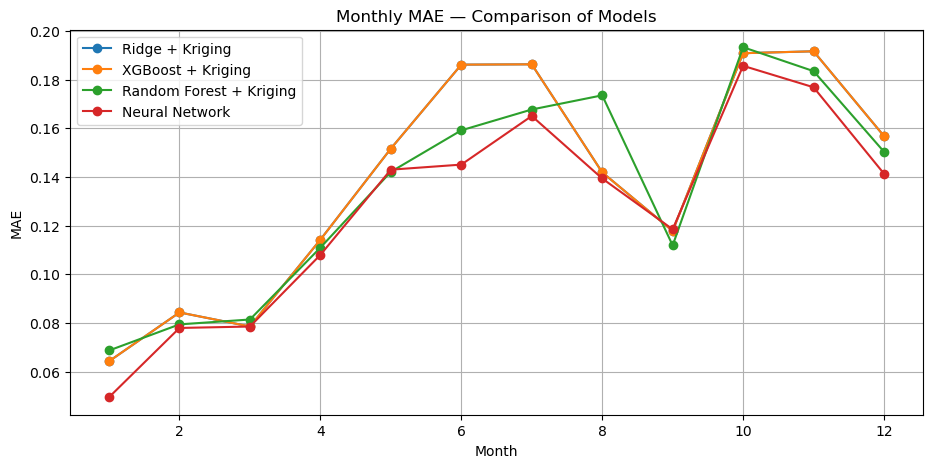

In [4]:
import matplotlib.pyplot as plt

plt.figure(figsize=(11,5))

plt.plot(df_rl["month"], df_rl["MAE_krig"], "-o", label="Ridge + Kriging")
plt.plot(df_xg["month"], df_xg["MAE_krig"], "-o", label="XGBoost + Kriging")
plt.plot(df_rf["month"], df_rf["MAE_krig"], "-o", label="Random Forest + Kriging")
plt.plot(df_nn["month"], df_nn["MAE"], "-o", label="Neural Network")

plt.xlabel("Month")
plt.ylabel("MAE")
plt.title("Monthly MAE — Comparison of Models")
plt.legend()
plt.grid(True)

plt.show()


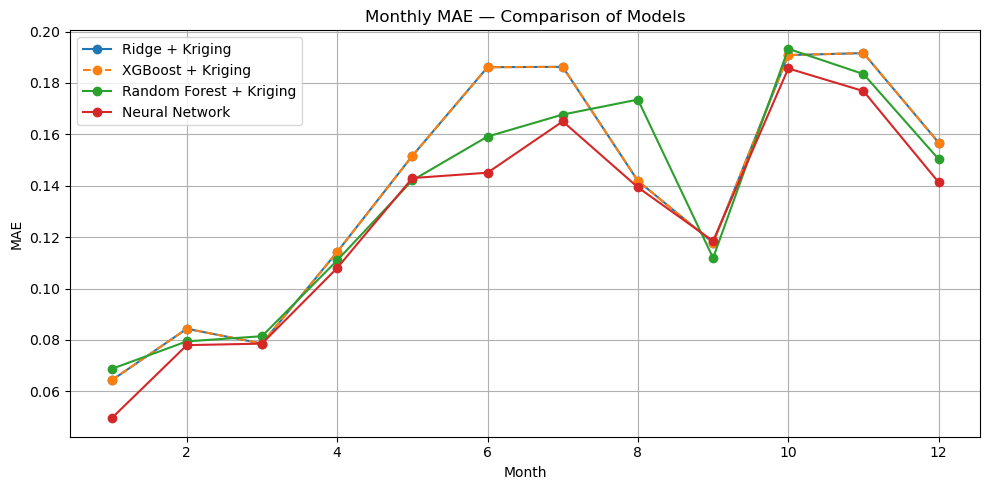

In [5]:
plt.figure(figsize=(10, 5))

plt.plot(
    df_rl["month"],
    df_rl["MAE_krig"],
    color="tab:blue",
    linestyle="-",          # trait continu
    marker="o",
    label="Ridge + Kriging"
)

plt.plot(
    df_xg["month"],
    df_xg["MAE_krig"],
    color="tab:orange",
    linestyle="--",         # trait interrompu
    marker="o",
    label="XGBoost + Kriging"
)

plt.plot(
    df_rf["month"],
    df_rf["MAE_krig"],
    color="tab:green",
    linestyle="-",
    marker="o",
    label="Random Forest + Kriging"
)

plt.plot(
    df_nn["month"],
    df_nn["MAE"],
    color="tab:red",
    linestyle="-",
    marker="o",
    label="Neural Network"
)

plt.xlabel("Month")
plt.ylabel("MAE")
plt.title("Monthly MAE — Comparison of Models")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()


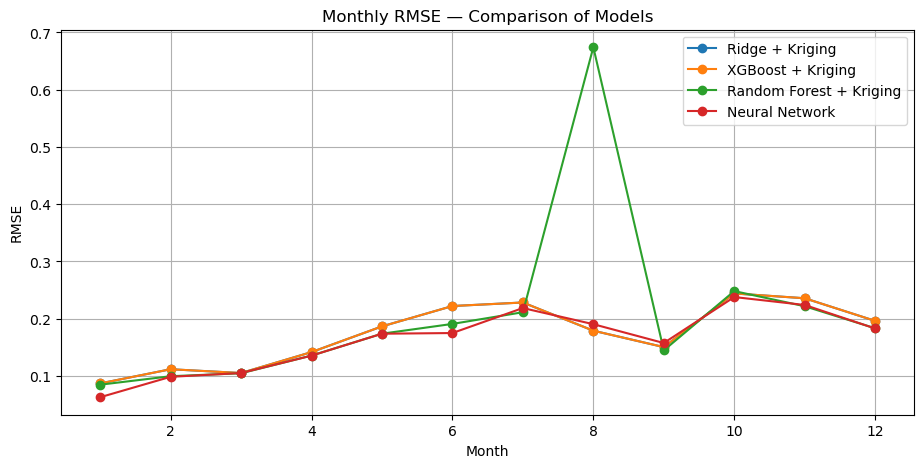

In [12]:
plt.figure(figsize=(11,5))

plt.plot(df_rl["month"], df_rl["RMSE_krig"], "-o", label="Ridge + Kriging")
plt.plot(df_xg["month"], df_xg["RMSE_krig"], "-o", label="XGBoost + Kriging")
plt.plot(df_rf["month"], df_rf["RMSE_krig"], "-o", label="Random Forest + Kriging")
plt.plot(df_nn["month"], df_nn["RMSE"], "-o", label="Neural Network")

plt.xlabel("Month")
plt.ylabel("RMSE")
plt.title("Monthly RMSE — Comparison of Models")
plt.legend()
plt.grid(True)

plt.show()


In [1]:
import pandas as pd

datapred = pd.read_csv("../data/df_test_nn_predictions.csv", sep=",")
datapred.head()

C:\Users\USER\AppData\Local\Temp\ipykernel_10932\2505427885.py:3: DtypeWarning: Columns (6,10) have mixed types. Specify dtype option on import or set low_memory=False.
  datapred = pd.read_csv("../data/df_test_nn_predictions.csv", sep=",")


,NUMERO,LAMBX_93,LAMBY_93,LAMBX_2,LAMBY_2,ANNEE,code_insee_commune,commune,code_insee_de_la_region,region,...,err_03,err_04,err_05,err_06,err_07,err_08,err_09,err_10,err_11,err_12
0,2,641374,7106309,588000,2673000,2020,59273,Gravelines,32,Hauts-de-France,...,-0.089967,0.110562,0.212883,0.159610,0.006841,-0.011258,-0.083043,-0.243193,-0.128475,-0.018287
1,2,641374,7106309,588000,2673000,2021,59273,Gravelines,32,Hauts-de-France,...,0.016099,0.054923,0.021564,-0.108523,-0.389654,-0.348900,-0.143110,-0.136188,-0.147091,-0.323303
2,2,641374,7106309,588000,2673000,2022,59273,Gravelines,32,Hauts-de-France,...,0.117885,0.019785,0.252660,0.192264,0.174625,0.185550,0.033145,-0.159283,-0.266363,-0.334924
3,2,641374,7106309,588000,2673000,2023,59273,Gravelines,32,Hauts-de-France,...,-0.057086,-0.191170,-0.216233,-0.105327,-0.046573,-0.108065,-0.041566,-0.024770,-0.529123,-0.409115
4,2,641374,7106309,588000,2673000,2024,59273,Gravelines,32,Hauts-de-France,...,-0.123299,-0.092613,-0.049979,-0.187985,-0.245399,-0.103642,-0.066050,-0.115388,0.090275,0.125864


In [2]:
datapred.columns.tolist()

['NUMERO',
 'LAMBX_93',
 'LAMBY_93',
 'LAMBX_2',
 'LAMBY_2',
 'ANNEE',
 'code_insee_commune',
 'commune',
 'code_insee_de_la_region',
 'region',
 'code_insee_departement',
 'departement',
 'argile_niveau',
 'swi_unif_01',
 'swi_unif_02',
 'swi_unif_03',
 'swi_unif_04',
 'swi_unif_05',
 'swi_unif_06',
 'swi_unif_07',
 'swi_unif_08',
 'swi_unif_09',
 'swi_unif_10',
 'swi_unif_11',
 'swi_unif_12',
 'SWI_01',
 'SWI_02',
 'SWI_03',
 'SWI_04',
 'SWI_05',
 'SWI_06',
 'SWI_07',
 'SWI_08',
 'SWI_09',
 'SWI_10',
 'SWI_11',
 'SWI_12',
 'DLI_01',
 'DLI_02',
 'DLI_03',
 'DLI_04',
 'DLI_05',
 'DLI_06',
 'DLI_07',
 'DLI_08',
 'DLI_09',
 'DLI_10',
 'DLI_11',
 'DLI_12',
 'DRAINC_01',
 'DRAINC_02',
 'DRAINC_03',
 'DRAINC_04',
 'DRAINC_05',
 'DRAINC_06',
 'DRAINC_07',
 'DRAINC_08',
 'DRAINC_09',
 'DRAINC_10',
 'DRAINC_11',
 'DRAINC_12',
 'ECOULEMENT_01',
 'ECOULEMENT_02',
 'ECOULEMENT_03',
 'ECOULEMENT_04',
 'ECOULEMENT_05',
 'ECOULEMENT_06',
 'ECOULEMENT_07',
 'ECOULEMENT_08',
 'ECOULEMENT_09',
 'ECOULE

In [3]:
datapred['code_insee_commune'] 

0        59273
1        59273
2        59273
3        59273
4        59273
         ...  
49455    2A041
49456    2A041
49457    2A041
49458    2A041
49459    2A041
Name: code_insee_commune, Length: 49460, dtype: object

# Représentations graphiques

In [4]:
import geopandas as gpd
LimitAdmin = r"D:\ENSAE Paris\3A\S1\ML_Climate_risk\Nouveau dossier\Bases\ADE_4-0_GPKG_LAMB93_FXX-ED2025-10-15.gpkg"
gdf_commune = gpd.read_file(LimitAdmin, layer="commune").to_crs(2154)

In [5]:
gdf_commune.head()

,cleabs,nom_officiel,nom_officiel_en_majuscules,statut,code_insee,population,date_du_recensement,organisme_recenseur,code_insee_du_canton,code_insee_de_l_arrondissement,code_insee_du_departement,code_insee_de_la_region,codes_siren_des_epci,code_siren,code_postal,superficie_cadastrale,geometry
0,COMMUNE_0000000000001001,L'Abergement-Clémenciat,L'ABERGEMENT-CLEMENCIAT,Commune simple,01001,859,2022-01-01,INSEE,0108,012,01,84,200069193,210100012,01400,1590,"MULTIPOLYGON (((851129.6 6563369.2, 851107.5 6..."
1,COMMUNE_0000000000001002,L'Abergement-de-Varey,L'ABERGEMENT-DE-VAREY,Commune simple,01002,273,2022-01-01,INSEE,0101,011,01,84,240100883,210100020,01640,920,"MULTIPOLYGON (((888109.7 6545455.9, 888102.9 6..."
2,COMMUNE_0000000000001004,Ambérieu-en-Bugey,AMBERIEU-EN-BUGEY,Commune simple,01004,15554,2022-01-01,INSEE,0101,011,01,84,240100883,210100046,01500,2460,"MULTIPOLYGON (((886593 6540886, 886567.9 65408..."
3,COMMUNE_0000000000001005,Ambérieux-en-Dombes,AMBERIEUX-EN-DOMBES,Commune simple,01005,1917,2022-01-01,INSEE,0122,012,01,84,200042497,210100053,01330,1590,"MULTIPOLYGON (((850413.2 6544061, 850381.8 654..."
4,COMMUNE_0000000000001006,Ambléon,AMBLEON,Commune simple,01006,114,2022-01-01,INSEE,0104,011,01,84,200040350,210100061,01300,590,"MULTIPOLYGON (((899820.1 6520340.2, 899925.2 6..."


In [42]:
gdf_commune.columns.tolist()

['cleabs',
 'nom_officiel',
 'nom_officiel_en_majuscules',
 'statut',
 'code_insee',
 'population',
 'date_du_recensement',
 'organisme_recenseur',
 'code_insee_du_canton',
 'code_insee_de_l_arrondissement',
 'code_insee_du_departement',
 'code_insee_de_la_region',
 'codes_siren_des_epci',
 'code_siren',
 'code_postal',
 'superficie_cadastrale',
 'geometry']

import numpy as np
import pandas as pd
import geopandas as gpd
import matplotlib.pyplot as plt

from shapely.geometry import Point
from pykrige.ok import OrdinaryKriging

# Copie sécurité
df = datapred.copy()

# Géométrie point (Lambert-93)
geometry = [Point(xy) for xy in zip(df["LAMBX_93"], df["LAMBY_93"])]

gdf_pts = gpd.GeoDataFrame(
    df,
    geometry=geometry,
    crs=2154
)

# Limites France (communes)
LimitAdmin = r"D:\ENSAE Paris\3A\S1\ML_Climate_risk\Nouveau dossier\Bases\ADE_4-0_GPKG_LAMB93_FXX-ED2025-10-15.gpkg"
gdf_communes = gpd.read_file(LimitAdmin, layer="commune").to_crs(2154)

# Enveloppe France
xmin, ymin, xmax, ymax = gdf_communes.total_bounds

# Grille régulière (5 km)
step = 5000
xs = np.arange(xmin, xmax, step)
ys = np.arange(ymin, ymax, step)

grid_points = np.array([(x, y) for x in xs for y in ys])
gdf_grid = gpd.GeoDataFrame(
    geometry=[Point(xy) for xy in grid_points],
    crs=2154
)

# Garder seulement les points dans la France
gdf_grid = gdf_grid[gdf_grid.within(gdf_communes.unary_union)]


In [7]:
import numpy as np
import pandas as pd
import geopandas as gpd
import matplotlib.pyplot as plt

from shapely.geometry import Point
from scipy.spatial import cKDTree
from pykrige.ok import OrdinaryKriging

# ------------------------------------------------------------
# Erreur moyenne sur les 12 mois
# ------------------------------------------------------------
err_cols = [f"err_{m:02d}" for m in range(1, 13)]

datapred["err_mean_12m"] = datapred[err_cols].mean(axis=1)

# Années d'intérêt
years = [2021, 2022, 2023, 2024]


In [8]:
# ------------------------------------------------------------
# Points d'observation
# ------------------------------------------------------------
geometry = [
    Point(xy) for xy in zip(datapred["LAMBX_93"], datapred["LAMBY_93"])
]

gdf_obs = gpd.GeoDataFrame(
    datapred[["ANNEE", "err_mean_12m"]],
    geometry=geometry,
    crs=2154
)


In [9]:
# ------------------------------------------------------------
# Grille régulière (ex: 5 km)
# ------------------------------------------------------------
xmin, ymin, xmax, ymax = gdf_obs.total_bounds

step = 5_000  # 5 km

grid_x = np.arange(xmin, xmax, step)
grid_y = np.arange(ymin, ymax, step)

grid_points = np.array([(x, y) for x in grid_x for y in grid_y])


In [10]:
def local_kriging(
    xy_obs,
    values,
    xy_pred,
    variogram_model="exponential",
    variogram_params=None,
    k=40
):
    """
    Local Ordinary Kriging (Moving Window)
    """
    tree = cKDTree(xy_obs)
    _, idxs = tree.query(xy_pred, k=k)

    preds = np.zeros(len(xy_pred))
    vars_ = np.zeros(len(xy_pred))

    for i, neighbors in enumerate(idxs):
        pts = xy_obs[neighbors]
        vals = values[neighbors]

        OK = OrdinaryKriging(
            pts[:, 0], pts[:, 1], vals,
            variogram_model=variogram_model,
            variogram_parameters=variogram_params,
            verbose=False,
            enable_plotting=False
        )

        z, ss = OK.execute(
            "points",
            [xy_pred[i, 0]],
            [xy_pred[i, 1]]
        )

        preds[i] = z[0]
        vars_[i] = ss[0]

    return preds, vars_


In [12]:
import numpy as np
from pykrige.ok import OrdinaryKriging
from scipy.spatial import cKDTree

def local_kriging_safe(
    xy_obs,
    values,
    xy_pred,
    variogram_model="exponential",
    k=25,
    eps=1e-6
):
    """
    Krigeage local robuste :
    - voisinage limité
    - pseudo-inverse
    - fallback si matrice singulière
    """

    tree = cKDTree(xy_obs)

    preds = np.full(len(xy_pred), np.nan)
    vars_ = np.full(len(xy_pred), np.nan)

    for i, pt in enumerate(xy_pred):

        dists, idx = tree.query(pt, k=k)

        pts = xy_obs[idx]
        vals = values[idx]

        # sécurité : variance non nulle
        if np.std(vals) < eps:
            preds[i] = np.mean(vals)
            vars_[i] = 0.0
            continue

        try:
            OK = OrdinaryKriging(
                pts[:, 0],
                pts[:, 1],
                vals,
                variogram_model=variogram_model,
                enable_plotting=False,
                verbose=False,
                pseudo_inv=True,          # 🔥 CRUCIAL
                pseudo_inv_type="pinv"    # 🔥 STABLE
            )

            z, ss = OK.execute(
                "points",
                [pt[0]],
                [pt[1]],
                backend="loop"
            )

            preds[i] = z[0]
            vars_[i] = ss[0]

        except Exception:
            # fallback ultra sûr
            preds[i] = np.mean(vals)
            vars_[i] = np.var(vals)

    return preds, vars_


In [18]:
results = {}

for year in years:
    print(f"▶ Kriging local — année {year}")

    gdf_year = gdf_obs[gdf_obs["ANNEE"] == year].dropna()

    xy_obs = np.vstack([
        gdf_year.geometry.x.values,
        gdf_year.geometry.y.values
    ]).T

    values = gdf_year["err_mean_12m"].values

    preds, vars_ = local_kriging_safe(
        xy_obs=xy_obs,
        values=values,
        xy_pred=grid_points,
        variogram_model="exponential",
        k=40
    )

    gdf_grid = gpd.GeoDataFrame(
        {
            "err_pred": preds,
            "err_var": vars_
        },
        geometry=[Point(xy) for xy in grid_points],
        crs=2154
    )

    results[year] = gdf_grid


▶ Kriging local — année 2021
▶ Kriging local — année 2022
▶ Kriging local — année 2023
▶ Kriging local — année 2024


Exponentiel (celui qu’on utilise)

Interprétation :

- corrélation forte à très courte distance

- décroissance rapide

- pas parfaitement lisse à l’origine

C’est ce qu’on observe pour des erreurs climatiques / hydrologiques.

In [19]:
import geopandas as gpd
import matplotlib.pyplot as plt
import numpy as np

# ------------------------------------------------------------
# 0) DONNÉES ADMINISTRATIVES (COMMUNES)
# ------------------------------------------------------------
LimitAdmin = r"D:\ENSAE Paris\3A\S1\ML_Climate_risk\Nouveau dossier\Bases\ADE_4-0_GPKG_LAMB93_FXX-ED2025-10-15.gpkg"
gdf_commune = gpd.read_file(LimitAdmin, layer="commune").to_crs(2154)
gdf_commune["code_insee"] = gdf_commune["code_insee"].astype(str)

# ------------------------------------------------------------
# 1) AGRÉGATION GRILLE → COMMUNE (rapide)
# ------------------------------------------------------------
maps_by_year = {}

for year, gdf_grid in results.items():

    # jointure spatiale point → commune
    join = gpd.sjoin(
        gdf_grid,
        gdf_commune[["code_insee", "geometry"]],
        how="inner",
        predicate="within"
    )

    # agrégation par commune
    agg = (
        join
        .groupby("code_insee")
        .agg(
            err_mean=("err_pred", "mean"),
            err_std=("err_pred", "std")   # incertitude spatiale
        )
        .reset_index()
    )

    # rattachement aux polygones
    gdf_map = gdf_commune.merge(
        agg,
        on="code_insee",
        how="left"
    )

    maps_by_year[year] = gdf_map



In [20]:
# ------------------------------------------------------------
# 2) BORNES DE COULEUR COMMUNES (robustes)
# ------------------------------------------------------------
all_vals = np.concatenate([
    gdf["err_mean"].dropna().values
    for gdf in maps_by_year.values()
])

vmin = np.quantile(all_vals, 0.02)
vmax = np.quantile(all_vals, 0.98)

C:\Users\USER\AppData\Local\Temp\ipykernel_10932\1948326194.py:48: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


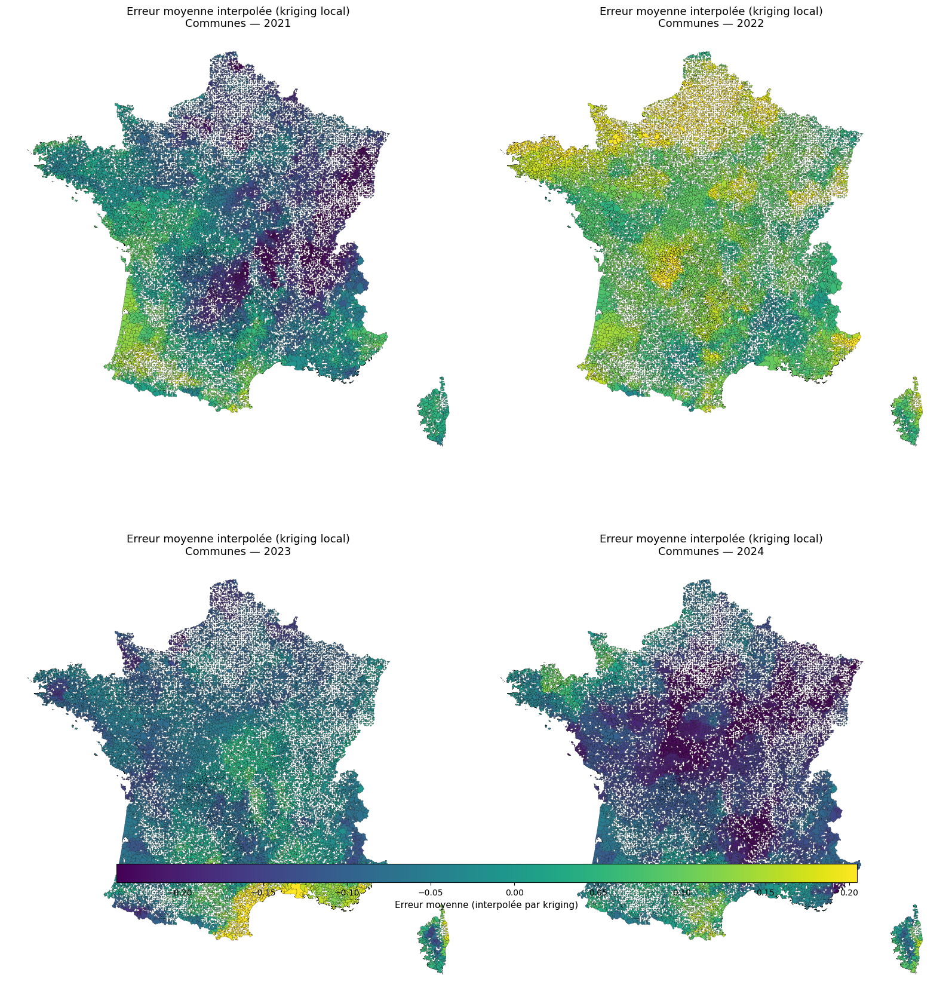

In [21]:
# ------------------------------------------------------------
# 3) FIGURE 2 × 2
# ------------------------------------------------------------
fig, axes = plt.subplots(2, 2, figsize=(16, 18))
axes = axes.flatten()

for ax, year in zip(axes, sorted(maps_by_year.keys())):

    gdf = maps_by_year[year]

    # carte communale
    gdf.plot(
        column="err_mean",
        cmap="viridis",
        vmin=vmin,
        vmax=vmax,
        linewidth=0.15,
        edgecolor="black",
        ax=ax
    )

    ax.set_title(
        f"Erreur moyenne interpolée (kriging local)\nCommunes — {year}",
        fontsize=13
    )
    ax.axis("off")

# ------------------------------------------------------------
# 4) COLORBAR UNIQUE, FINE
# ------------------------------------------------------------
sm = plt.cm.ScalarMappable(
    cmap="viridis",
    norm=plt.Normalize(vmin=vmin, vmax=vmax)
)
sm._A = []

cbar = fig.colorbar(
    sm,
    ax=axes,
    orientation="horizontal",
    fraction=0.025,   # très fine
    pad=0.03,
    aspect=40
)

cbar.set_label("Erreur moyenne (interpolée par kriging)", fontsize=11)

plt.tight_layout()
plt.show()

C:\Users\USER\AppData\Local\Temp\ipykernel_10932\2074890499.py:109: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


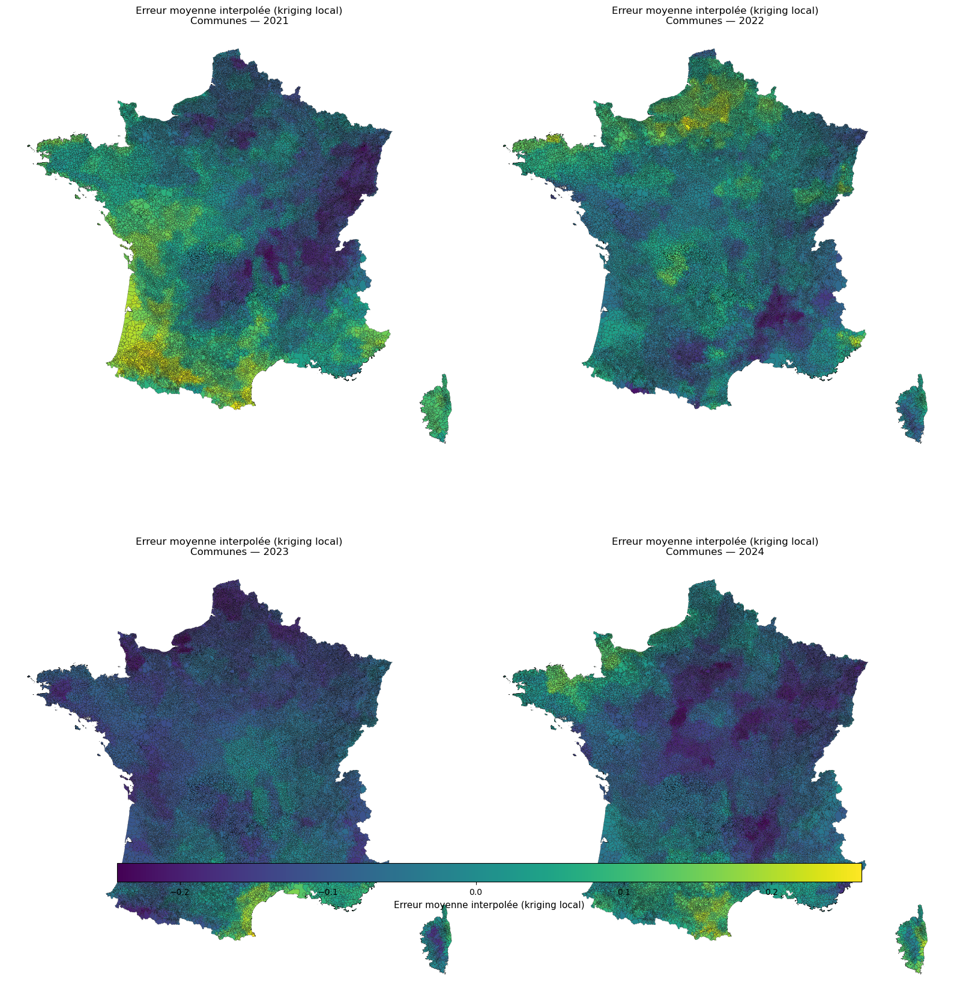

In [23]:
import geopandas as gpd
import numpy as np
from shapely.geometry import Point
from scipy.spatial import cKDTree
import matplotlib.pyplot as plt

# ------------------------------------------------------------
# PARAMÈTRES
# ------------------------------------------------------------
years = [2021, 2022, 2023, 2024]
cmap = "viridis"

fig, axes = plt.subplots(2, 2, figsize=(16, 18))
axes = axes.flatten()

# ------------------------------------------------------------
# BOUCLE PAR ANNÉE
# ------------------------------------------------------------
for ax, year in zip(axes, years):

    # ----------------------------
    # 1) Grille krigée
    # ----------------------------
    gdf_grid = results[year].copy()

    # KDTree sur la grille
    grid_xy = np.vstack([
        gdf_grid.geometry.x.values,
        gdf_grid.geometry.y.values
    ]).T
    tree = cKDTree(grid_xy)

    # ----------------------------
    # 2) Jointure grille → communes
    # ----------------------------
    gdf_map = gpd.sjoin(
        gdf_commune,
        gdf_grid[["err_pred", "geometry"]],
        how="left",
        predicate="contains"
    )

    gdf_commune_val = (
        gdf_map
        .groupby("code_insee", as_index=False)["err_pred"]
        .mean()
    )

    gdf_commune_val = gdf_commune.merge(
        gdf_commune_val,
        on="code_insee",
        how="left"
    )

    # ----------------------------
    # 3) CORRECTION DES COMMUNES BLANCHES (OPTION A)
    # ----------------------------
    missing = gdf_commune_val["err_pred"].isna()

    if missing.any():
        centroids = gdf_commune_val.loc[missing].geometry.centroid
        centroid_xy = np.vstack([centroids.x, centroids.y]).T

        dist, idx = tree.query(centroid_xy, k=1)

        gdf_commune_val.loc[missing, "err_pred"] = gdf_grid.iloc[idx]["err_pred"].values

    # ----------------------------
    # 4) PLOT
    # ----------------------------
    gdf_commune_val.plot(
        column="err_pred",
        ax=ax,
        cmap=cmap,
        linewidth=0.15,
        edgecolor="black",
        legend=False
    )

    ax.set_title(
        f"Erreur moyenne interpolée (kriging local)\nCommunes — {year}",
        fontsize=12
    )
    ax.axis("off")

# ------------------------------------------------------------
# COLORBAR FINE ET PROPRE
# ------------------------------------------------------------
sm = plt.cm.ScalarMappable(
    cmap=cmap,
    norm=plt.Normalize(
        vmin=min(results[y]["err_pred"].quantile(0.02) for y in years),
        vmax=max(results[y]["err_pred"].quantile(0.98) for y in years)
    )
)
sm._A = []

cbar = fig.colorbar(
    sm,
    ax=axes,
    orientation="horizontal",
    fraction=0.025,
    pad=0.04,
    aspect=40
)

cbar.set_label("Erreur moyenne interpolée (kriging local)", fontsize=11)

plt.tight_layout()
plt.show()


C:\Users\USER\AppData\Local\Temp\ipykernel_10932\459134235.py:115: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


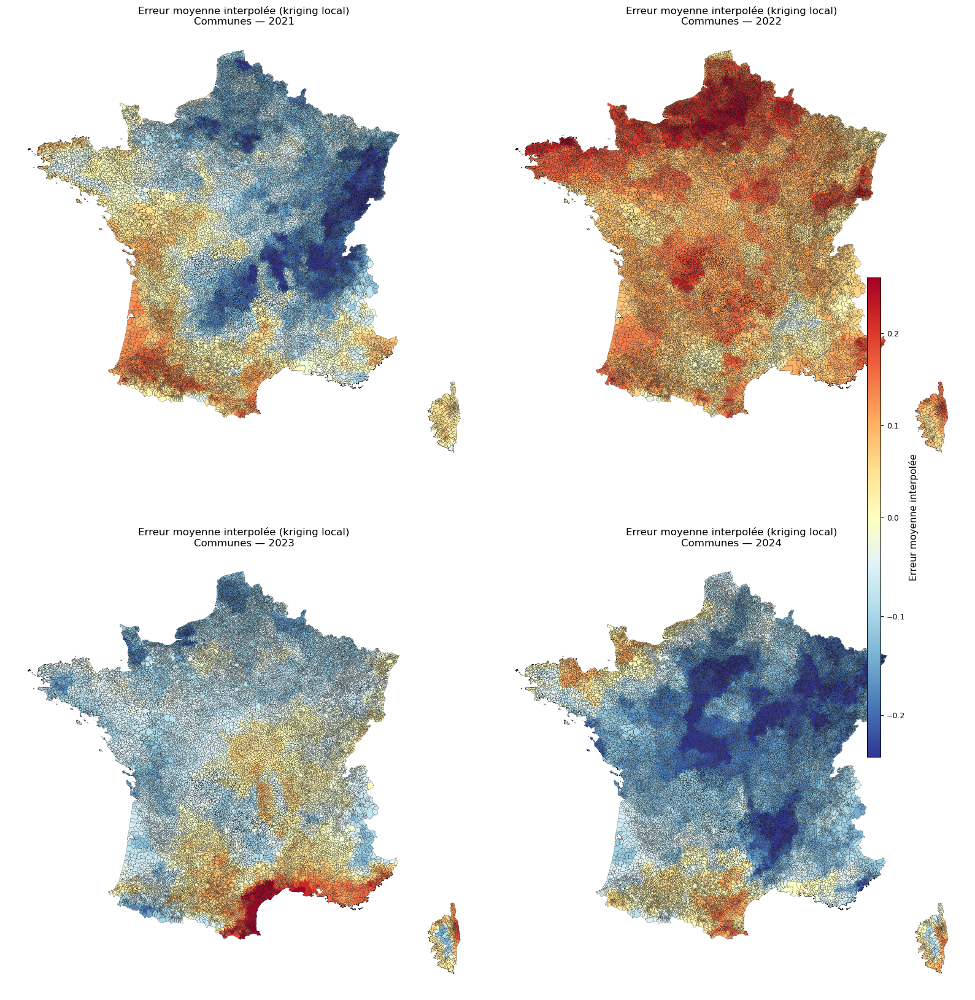

In [24]:
import geopandas as gpd
import numpy as np
from shapely.geometry import Point
from scipy.spatial import cKDTree
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors

# ------------------------------------------------------------
# PARAMÈTRES
# ------------------------------------------------------------
years = [2021, 2022, 2023, 2024]
cmap = "RdYlBu_r"   # 🔥 beaucoup plus contrastée que viridis

fig, axes = plt.subplots(2, 2, figsize=(16, 18))
axes = axes.flatten()

# ------------------------------------------------------------
# BORNES COMMUNES (robustes)
# ------------------------------------------------------------
vmin = min(results[y]["err_pred"].quantile(0.02) for y in years)
vmax = max(results[y]["err_pred"].quantile(0.98) for y in years)

norm = mcolors.TwoSlopeNorm(
    vmin=vmin,
    vcenter=0.0,   # zéro bien centré
    vmax=vmax
)

# ------------------------------------------------------------
# BOUCLE PAR ANNÉE
# ------------------------------------------------------------
for ax, year in zip(axes, years):

    # ----------------------------
    # 1) Grille krigée
    # ----------------------------
    gdf_grid = results[year].copy()

    grid_xy = np.vstack([
        gdf_grid.geometry.x.values,
        gdf_grid.geometry.y.values
    ]).T
    tree = cKDTree(grid_xy)

    # ----------------------------
    # 2) Jointure grille → communes
    # ----------------------------
    gdf_map = gpd.sjoin(
        gdf_commune,
        gdf_grid[["err_pred", "geometry"]],
        how="left",
        predicate="contains"
    )

    gdf_commune_val = (
        gdf_map
        .groupby("code_insee", as_index=False)["err_pred"]
        .mean()
    )

    gdf_commune_val = gdf_commune.merge(
        gdf_commune_val,
        on="code_insee",
        how="left"
    )

    # ----------------------------
    # 3) Correction des communes vides (Option A)
    # ----------------------------
    missing = gdf_commune_val["err_pred"].isna()

    if missing.any():
        centroids = gdf_commune_val.loc[missing].geometry.centroid
        centroid_xy = np.vstack([centroids.x, centroids.y]).T
        _, idx = tree.query(centroid_xy, k=1)
        gdf_commune_val.loc[missing, "err_pred"] = gdf_grid.iloc[idx]["err_pred"].values

    # ----------------------------
    # 4) Plot communal
    # ----------------------------
    gdf_commune_val.plot(
        column="err_pred",
        ax=ax,
        cmap=cmap,
        norm=norm,
        linewidth=0.15,
        edgecolor="black",
        legend=False
    )

    ax.set_title(
        f"Erreur moyenne interpolée (kriging local)\nCommunes — {year}",
        fontsize=12
    )
    ax.axis("off")

# ------------------------------------------------------------
# COLORBAR — VERTICALE, FINE, À DROITE
# ------------------------------------------------------------
sm = plt.cm.ScalarMappable(cmap=cmap, norm=norm)
sm._A = []

cbar = fig.colorbar(
    sm,
    ax=axes,
    orientation="vertical",
    fraction=0.018,   # 🔥 très fine
    pad=0.02,
    aspect=35
)

cbar.set_label("Erreur moyenne interpolée", fontsize=11)
cbar.ax.tick_params(labelsize=9)

plt.tight_layout()
plt.show()


In [25]:
gdf_commune_val.plot(
    column="err_pred",
    ax=ax,
    cmap=cmap,
    norm=norm,
    linewidth=0.05,      # ↓ beaucoup plus fin
    edgecolor="black",
    alpha=0.95
)


<Axes: title={'center': 'Erreur moyenne interpolée (kriging local)\nCommunes — 2024'}>

C:\Users\USER\AppData\Local\Temp\ipykernel_10932\1551135926.py:115: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


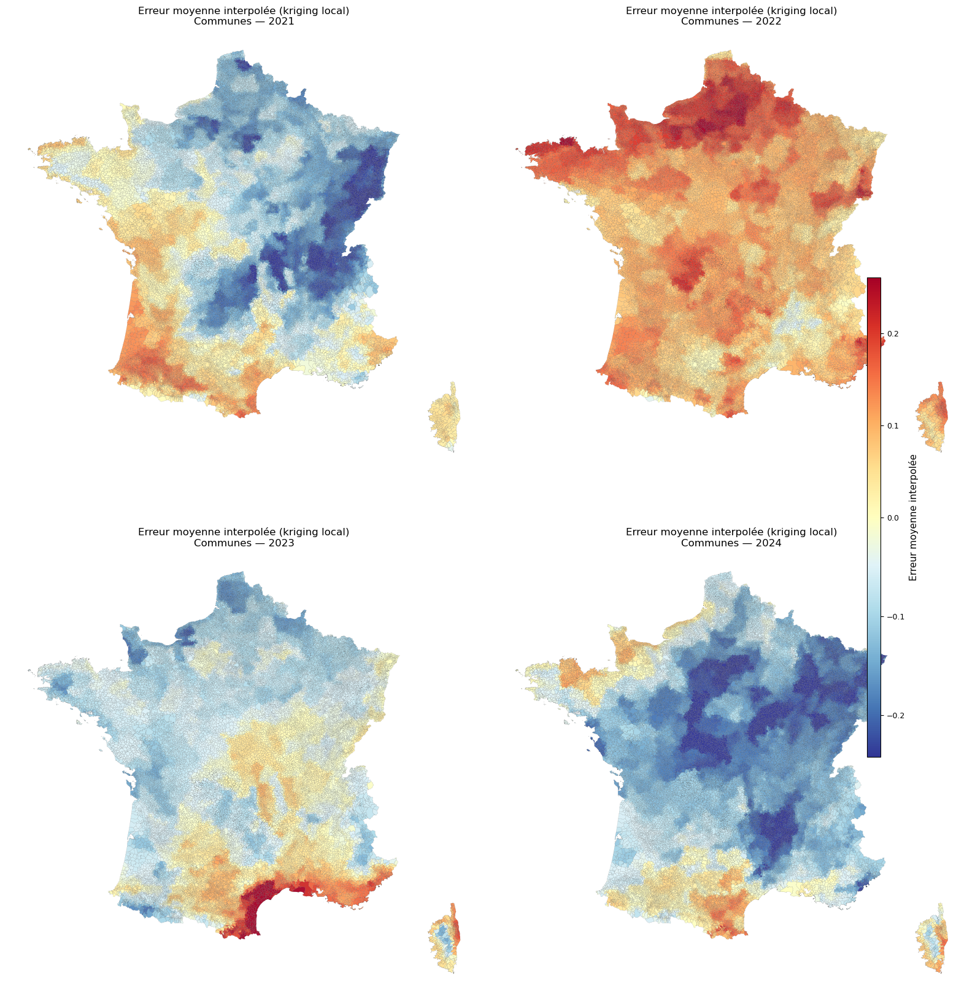

In [26]:
import geopandas as gpd
import numpy as np
from shapely.geometry import Point
from scipy.spatial import cKDTree
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors

# ------------------------------------------------------------
# PARAMÈTRES
# ------------------------------------------------------------
years = [2021, 2022, 2023, 2024]
cmap = "RdYlBu_r"   # 🔥 beaucoup plus contrastée que viridis

fig, axes = plt.subplots(2, 2, figsize=(16, 18))
axes = axes.flatten()

# ------------------------------------------------------------
# BORNES COMMUNES (robustes)
# ------------------------------------------------------------
vmin = min(results[y]["err_pred"].quantile(0.02) for y in years)
vmax = max(results[y]["err_pred"].quantile(0.98) for y in years)

norm = mcolors.TwoSlopeNorm(
    vmin=vmin,
    vcenter=0.0,   # zéro bien centré
    vmax=vmax
)

# ------------------------------------------------------------
# BOUCLE PAR ANNÉE
# ------------------------------------------------------------
for ax, year in zip(axes, years):

    # ----------------------------
    # 1) Grille krigée
    # ----------------------------
    gdf_grid = results[year].copy()

    grid_xy = np.vstack([
        gdf_grid.geometry.x.values,
        gdf_grid.geometry.y.values
    ]).T
    tree = cKDTree(grid_xy)

    # ----------------------------
    # 2) Jointure grille → communes
    # ----------------------------
    gdf_map = gpd.sjoin(
        gdf_commune,
        gdf_grid[["err_pred", "geometry"]],
        how="left",
        predicate="contains"
    )

    gdf_commune_val = (
        gdf_map
        .groupby("code_insee", as_index=False)["err_pred"]
        .mean()
    )

    gdf_commune_val = gdf_commune.merge(
        gdf_commune_val,
        on="code_insee",
        how="left"
    )

    # ----------------------------
    # 3) Correction des communes vides (Option A)
    # ----------------------------
    missing = gdf_commune_val["err_pred"].isna()

    if missing.any():
        centroids = gdf_commune_val.loc[missing].geometry.centroid
        centroid_xy = np.vstack([centroids.x, centroids.y]).T
        _, idx = tree.query(centroid_xy, k=1)
        gdf_commune_val.loc[missing, "err_pred"] = gdf_grid.iloc[idx]["err_pred"].values

    # ----------------------------
    # 4) Plot communal
    # ----------------------------
    gdf_commune_val.plot(
        column="err_pred",
        ax=ax,
        cmap=cmap,
        norm=norm,
        linewidth=0.05,      # ↓ beaucoup plus fin
        edgecolor="black",
        alpha=0.95
    )

    ax.set_title(
        f"Erreur moyenne interpolée (kriging local)\nCommunes — {year}",
        fontsize=12
    )
    ax.axis("off")

# ------------------------------------------------------------
# COLORBAR — VERTICALE, FINE, À DROITE
# ------------------------------------------------------------
sm = plt.cm.ScalarMappable(cmap=cmap, norm=norm)
sm._A = []

cbar = fig.colorbar(
    sm,
    ax=axes,
    orientation="vertical",
    fraction=0.018,   # 🔥 très fine
    pad=0.02,
    aspect=35
)

cbar.set_label("Erreur moyenne interpolée", fontsize=11)
cbar.ax.tick_params(labelsize=9)

plt.tight_layout()
plt.show()


▶ Kriging local — année 2020
▶ Agrégation communale — année 2020
▶ Agrégation communale — année 2021
▶ Agrégation communale — année 2022
▶ Agrégation communale — année 2023
▶ Agrégation communale — année 2024


AttributeError: Line2D.set() got an unexpected keyword argument 'norm'

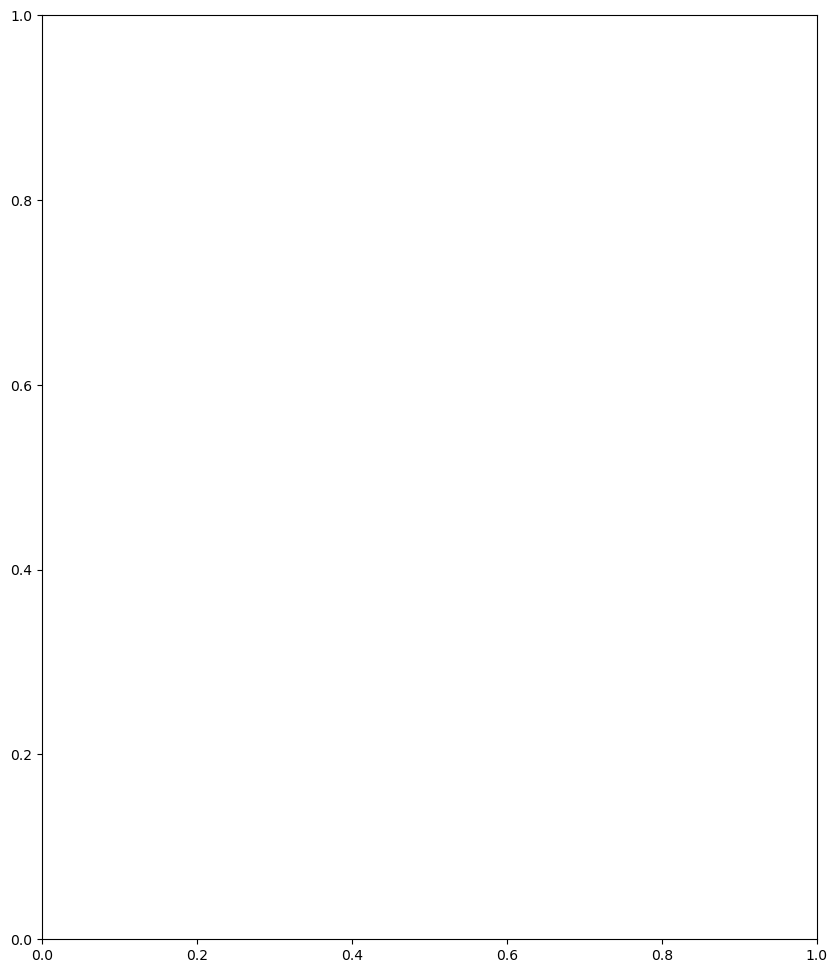

In [ ]:
# ============================================================
# CARTE NATIONALE — ERREUR MOYENNE INTERPOLÉE (2020–2024)
# Kriging local + agrégation communale + moyenne temporelle
# ============================================================

import geopandas as gpd
import numpy as np
from shapely.geometry import Point
from scipy.spatial import cKDTree
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors

# ------------------------------------------------------------
# PARAMÈTRES
# ------------------------------------------------------------
years = [2020, 2021, 2022, 2023, 2024]
cmap = "RdYlBu_r"   # palette très contrastée, centrée sur 0

# ============================================================
# SÉCURITÉ : KRIGING 2020 S'IL MANQUE
# ============================================================

if 2020 not in results:
    print("▶ Kriging local — année 2020")

    gdf_year = gdf_obs[gdf_obs["ANNEE"] == 2020].dropna(
        subset=["err_mean_12m"]
    )

    xy_obs = np.column_stack(
        (gdf_year.geometry.x.values, gdf_year.geometry.y.values)
    )

    values = gdf_year["err_mean_12m"].values

    preds, vars_ = local_kriging_safe(
        xy_obs=xy_obs,
        values=values,
        xy_pred=grid_points,
        variogram_model="exponential",
        k=40
    )

    results[2020] = gpd.GeoDataFrame(
        {
            "err_pred": preds,
            "err_var": vars_
        },
        geometry=[Point(xy) for xy in grid_points],
        crs=2154
    )

else:
    print("✔ Kriging 2020 déjà présent")


# ------------------------------------------------------------
# 1) AGRÉGATION COMMUNALE PAR ANNÉE (SANS TROUS)
# ------------------------------------------------------------
commune_year_vals = []

for year in years:
    print(f"▶ Agrégation communale — année {year}")

    # ---- Grille krigée ----
    gdf_grid = results[year].copy()

    grid_xy = np.vstack([
        gdf_grid.geometry.x.values,
        gdf_grid.geometry.y.values
    ]).T
    tree = cKDTree(grid_xy)

    # ---- Jointure spatiale grille → communes ----
    gdf_map = gpd.sjoin(
        gdf_commune,
        gdf_grid[["err_pred", "geometry"]],
        how="left",
        predicate="contains"
    )

    gdf_commune_val = (
        gdf_map
        .groupby("code_insee", as_index=False)["err_pred"]
        .mean()
    )

    gdf_commune_val = gdf_commune.merge(
        gdf_commune_val,
        on="code_insee",
        how="left"
    )

    # ---- Option A : correction des communes sans point ----
    missing = gdf_commune_val["err_pred"].isna()

    if missing.any():
        centroids = gdf_commune_val.loc[missing].geometry.centroid
        centroid_xy = np.vstack([centroids.x, centroids.y]).T
        _, idx = tree.query(centroid_xy, k=1)
        gdf_commune_val.loc[missing, "err_pred"] = (
            gdf_grid.iloc[idx]["err_pred"].values
        )

    gdf_commune_val["ANNEE"] = year
    commune_year_vals.append(
        gdf_commune_val[["code_insee", "err_pred", "geometry", "ANNEE"]]
    )


In [ ]:
# ------------------------------------------------------------
# 2) MOYENNE TEMPORELLE 2020–2024 (PAR COMMUNE)
# ------------------------------------------------------------
gdf_all = gpd.GeoDataFrame(
    pd.concat(commune_year_vals, ignore_index=True),
    crs=gdf_commune.crs
)

gdf_mean = (
    gdf_all
    .groupby("code_insee", as_index=False)
    .agg(
        err_mean_2020_2024=("err_pred", "mean"),
        geometry=("geometry", "first")
    )
)

# ------------------------------------------------------------
# 3) BORNES ROBUSTES + NORMALISATION CENTRÉE SUR 0
# ------------------------------------------------------------
vmin = gdf_mean["err_mean_2020_2024"].quantile(0.02)
vmax = gdf_mean["err_mean_2020_2024"].quantile(0.98)

norm = mcolors.TwoSlopeNorm(
    vmin=vmin,
    vcenter=0.0,
    vmax=vmax
)

# ------------------------------------------------------------
# 4) PLOT FINAL — CARTE NATIONALE UNIQUE
# ------------------------------------------------------------
fig, ax = plt.subplots(1, 1, figsize=(10, 12))

gdf_mean.plot(
    column="err_mean_2020_2024",
    ax=ax,
    cmap=cmap,
    norm=norm,
    linewidth=0.05,        # contours communaux visibles mais fins
    edgecolor="black",
    alpha=0.95
)

ax.set_title(
    "Erreur moyenne interpolée (kriging local)\n"
    "Moyenne temporelle 2020–2024 — niveau communal",
    fontsize=14
)
ax.axis("off")

# ------------------------------------------------------------
# 5) COLORBAR — VERTICALE, FINE, À DROITE
# ------------------------------------------------------------
sm = plt.cm.ScalarMappable(cmap=cmap, norm=norm)
sm._A = []

cbar = fig.colorbar(
    sm,
    ax=ax,
    orientation="vertical",
    fraction=0.03,   # très fine
    pad=0.02,
    aspect=40
)

cbar.set_label(
    "Erreur moyenne interpolée (2020–2024)",
    fontsize=11
)
cbar.ax.tick_params(labelsize=9)

plt.tight_layout()
plt.show()


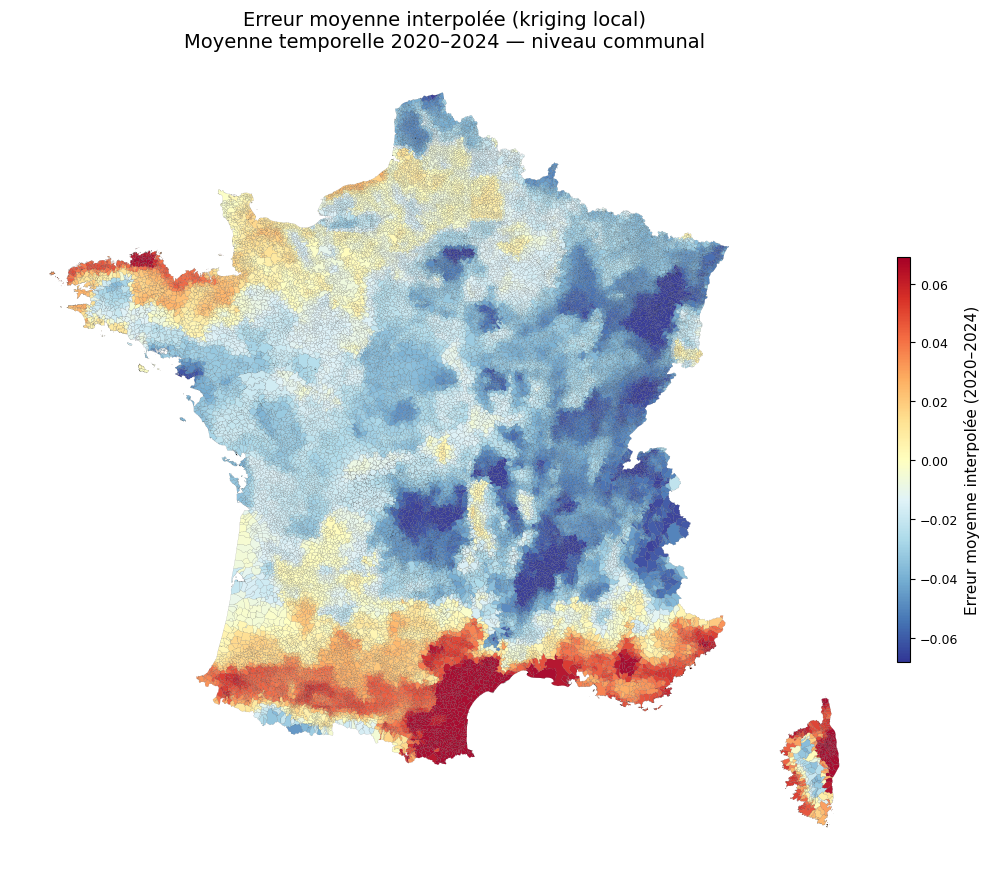

In [30]:
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
import geopandas as gpd

gdf_all = gpd.GeoDataFrame(
    pd.concat(commune_year_vals, ignore_index=True),
    crs=gdf_commune.crs
)

# ------------------------------------------------------------
# SÉCURISATION : s'assurer que c'est bien un GeoDataFrame
# ------------------------------------------------------------
gdf_mean = gpd.GeoDataFrame(
    gdf_mean,
    geometry="geometry",
    crs=gdf_commune.crs
)

# ------------------------------------------------------------
# NORMALISATION ROBUSTE
# ------------------------------------------------------------
vmin = gdf_mean["err_mean_2020_2024"].quantile(0.02)
vmax = gdf_mean["err_mean_2020_2024"].quantile(0.98)

norm = mcolors.TwoSlopeNorm(
    vmin=vmin,
    vcenter=0.0,
    vmax=vmax
)

cmap = "RdYlBu_r"

# ------------------------------------------------------------
# PLOT FINAL — CARTE NATIONALE
# ------------------------------------------------------------
fig, ax = plt.subplots(1, 1, figsize=(10, 12))

gdf_mean.plot(
    column="err_mean_2020_2024",
    ax=ax,
    cmap=cmap,
    norm=norm,
    linewidth=0.05,
    edgecolor="black",
    alpha=0.95
)

ax.set_title(
    "Erreur moyenne interpolée (kriging local)\n"
    "Moyenne temporelle 2020–2024 — niveau communal",
    fontsize=14
)
ax.axis("off")

# ------------------------------------------------------------
# COLORBAR — VERTICALE, FINE
# ------------------------------------------------------------
sm = plt.cm.ScalarMappable(cmap=cmap, norm=norm)
sm._A = []

cbar = fig.colorbar(
    sm,
    ax=ax,
    orientation="vertical",
    fraction=0.015,
    pad=0.02,
    aspect=30
)


cbar.set_label("Erreur moyenne interpolée (2020–2024)", fontsize=11)
cbar.ax.tick_params(labelsize=9)

plt.tight_layout()
plt.show()


In [35]:
gdf_mean.columns.tolist()


['code_insee', 'err_mean_2020_2024', 'geometry']

In [39]:
gdf_commune.head()

,cleabs,nom_officiel,nom_officiel_en_majuscules,statut,code_insee,population,date_du_recensement,organisme_recenseur,code_insee_du_canton,code_insee_de_l_arrondissement,code_insee_du_departement,code_insee_de_la_region,codes_siren_des_epci,code_siren,code_postal,superficie_cadastrale,geometry
0,COMMUNE_0000000000001001,L'Abergement-Clémenciat,L'ABERGEMENT-CLEMENCIAT,Commune simple,01001,859,2022-01-01,INSEE,0108,012,01,84,200069193,210100012,01400,1590,"MULTIPOLYGON (((851129.6 6563369.2, 851107.5 6..."
1,COMMUNE_0000000000001002,L'Abergement-de-Varey,L'ABERGEMENT-DE-VAREY,Commune simple,01002,273,2022-01-01,INSEE,0101,011,01,84,240100883,210100020,01640,920,"MULTIPOLYGON (((888109.7 6545455.9, 888102.9 6..."
2,COMMUNE_0000000000001004,Ambérieu-en-Bugey,AMBERIEU-EN-BUGEY,Commune simple,01004,15554,2022-01-01,INSEE,0101,011,01,84,240100883,210100046,01500,2460,"MULTIPOLYGON (((886593 6540886, 886567.9 65408..."
3,COMMUNE_0000000000001005,Ambérieux-en-Dombes,AMBERIEUX-EN-DOMBES,Commune simple,01005,1917,2022-01-01,INSEE,0122,012,01,84,200042497,210100053,01330,1590,"MULTIPOLYGON (((850413.2 6544061, 850381.8 654..."
4,COMMUNE_0000000000001006,Ambléon,AMBLEON,Commune simple,01006,114,2022-01-01,INSEE,0104,011,01,84,200040350,210100061,01300,590,"MULTIPOLYGON (((899820.1 6520340.2, 899925.2 6..."


NA région (après merge) : 0.0
Grand Est (44)  : 5115 communes
Bretagne (53)   : 1202 communes


C:\Users\USER\AppData\Local\Temp\ipykernel_10932\3180050544.py:109: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


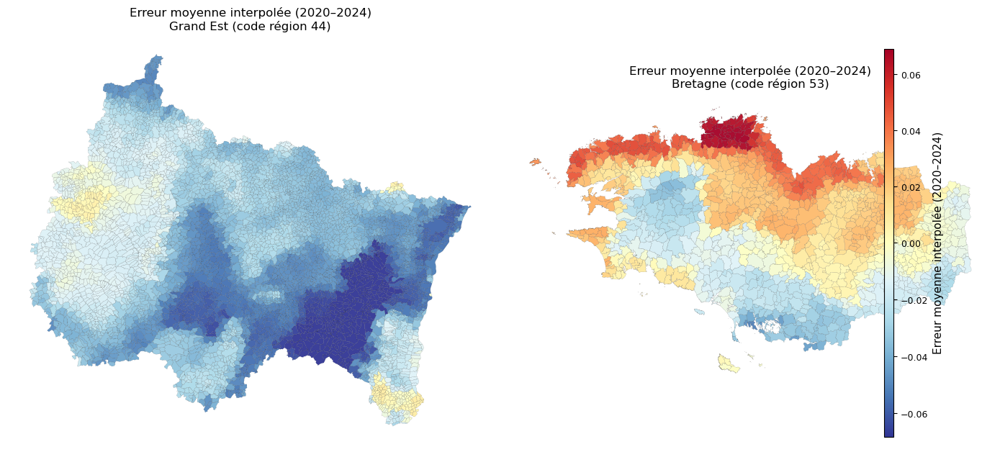

In [43]:
import geopandas as gpd
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors

# ============================================================
# ZOOMS REGIONAUX (Grand Est = 44, Bretagne = 53)
# - On part de gdf_mean : ['code_insee','err_mean_2020_2024','geometry']
# - On récupère code_insee_de_la_region via gdf_commune (clé commune)
# ============================================================

# ----------------------------
# 0) Sécuriser les types / zéros initiaux
# ----------------------------
# code commune INSEE = 5 caractères en général (ex: "01001")
gdf_mean = gdf_mean.copy()
gdf_commune = gdf_commune.copy()

gdf_mean["code_insee"] = gdf_mean["code_insee"].astype(str).str.zfill(5)
gdf_commune["code_insee"] = gdf_commune["code_insee"].astype(str).str.zfill(5)
gdf_commune["code_insee_de_la_region"] = gdf_commune["code_insee_de_la_region"].astype(str).str.zfill(2)

# ----------------------------
# 1) Construire un mapping commune -> région depuis gdf_commune
# ----------------------------
# (une commune appartient à une région : on garde 1 ligne par code_insee)
commune_to_region = (
    gdf_commune[["code_insee", "code_insee_de_la_region"]]
    .drop_duplicates("code_insee")
)

# ----------------------------
# 2) Joindre le code région à gdf_mean
# ----------------------------
gdf_mean_reg = gdf_mean.merge(
    commune_to_region,
    on="code_insee",
    how="left"
)

# (Optionnel) diagnostic rapide
print("NA région (après merge) :", gdf_mean_reg["code_insee_de_la_region"].isna().mean())

# ----------------------------
# 3) Filtrage des régions
# ----------------------------
REG_EST = "44"
REG_BRETAGNE = "53"

gdf_est = gdf_mean_reg[gdf_mean_reg["code_insee_de_la_region"] == REG_EST].copy()
gdf_bretagne = gdf_mean_reg[gdf_mean_reg["code_insee_de_la_region"] == REG_BRETAGNE].copy()

print("Grand Est (44)  :", len(gdf_est), "communes")
print("Bretagne (53)   :", len(gdf_bretagne), "communes")

# ----------------------------
# 4) Normalisation commune (même échelle que national)
# ----------------------------
vmin = gdf_mean_reg["err_mean_2020_2024"].quantile(0.02)
vmax = gdf_mean_reg["err_mean_2020_2024"].quantile(0.98)

norm = mcolors.TwoSlopeNorm(vmin=vmin, vcenter=0.0, vmax=vmax)
cmap = "RdYlBu_r"

# ----------------------------
# 5) PLOT : 2 cartes côte à côte + colorbar unique à droite
# ----------------------------
fig, axes = plt.subplots(1, 2, figsize=(14, 7))

gdf_est.plot(
    column="err_mean_2020_2024",
    ax=axes[0],
    cmap=cmap,
    norm=norm,
    linewidth=0.06,
    edgecolor="black",
    alpha=0.95
)
axes[0].set_title("Erreur moyenne interpolée (2020–2024)\nGrand Est (code région 44)", fontsize=12)
axes[0].axis("off")

gdf_bretagne.plot(
    column="err_mean_2020_2024",
    ax=axes[1],
    cmap=cmap,
    norm=norm,
    linewidth=0.06,
    edgecolor="black",
    alpha=0.95
)
axes[1].set_title("Erreur moyenne interpolée (2020–2024)\nBretagne (code région 53)", fontsize=12)
axes[1].axis("off")

# Colorbar verticale, fine, à droite
sm = plt.cm.ScalarMappable(cmap=cmap, norm=norm)
sm._A = []

cbar = fig.colorbar(
    sm,
    ax=axes,
    orientation="vertical",
    fraction=0.025,  # fine
    pad=0.02,
    aspect=40
)
cbar.set_label("Erreur moyenne interpolée (2020–2024)", fontsize=11)
cbar.ax.tick_params(labelsize=9)

plt.tight_layout()
plt.show()


NA région (après merge) : 0.0
Occitanie (76)  : 4446 communes
Provence Côte d'Azur (93)   : 946 communes


C:\Users\USER\AppData\Local\Temp\ipykernel_10932\930033729.py:109: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


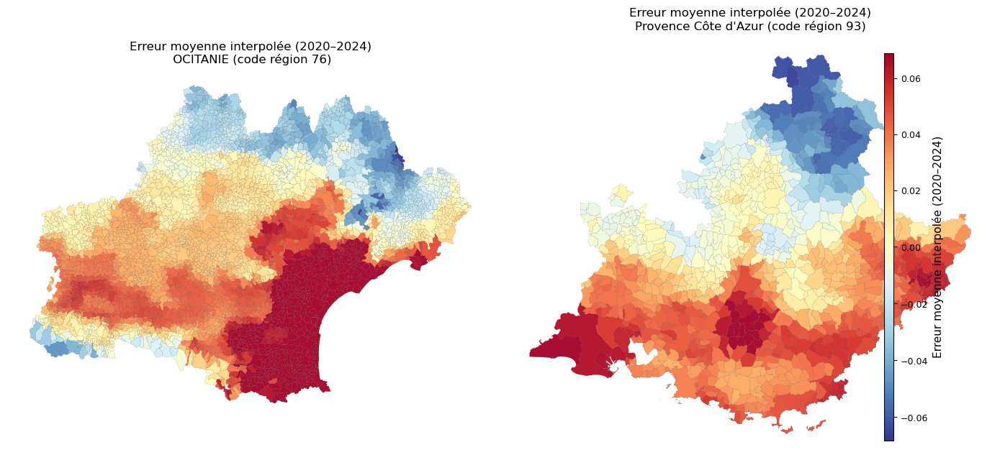

In [47]:
import geopandas as gpd
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors

# ============================================================
# ZOOMS REGIONAUX (Grand Est = 44, Bretagne = 53)
# - On part de gdf_mean : ['code_insee','err_mean_2020_2024','geometry']
# - On récupère code_insee_de_la_region via gdf_commune (clé commune)
# ============================================================

# ----------------------------
# 0) Sécuriser les types / zéros initiaux
# ----------------------------
# code commune INSEE = 5 caractères en général (ex: "01001")
gdf_mean = gdf_mean.copy()
gdf_commune = gdf_commune.copy()

gdf_mean["code_insee"] = gdf_mean["code_insee"].astype(str).str.zfill(5)
gdf_commune["code_insee"] = gdf_commune["code_insee"].astype(str).str.zfill(5)
gdf_commune["code_insee_de_la_region"] = gdf_commune["code_insee_de_la_region"].astype(str).str.zfill(2)

# ----------------------------
# 1) Construire un mapping commune -> région depuis gdf_commune
# ----------------------------
# (une commune appartient à une région : on garde 1 ligne par code_insee)
commune_to_region = (
    gdf_commune[["code_insee", "code_insee_de_la_region"]]
    .drop_duplicates("code_insee")
)

# ----------------------------
# 2) Joindre le code région à gdf_mean
# ----------------------------
gdf_mean_reg = gdf_mean.merge(
    commune_to_region,
    on="code_insee",
    how="left"
)

# (Optionnel) diagnostic rapide
print("NA région (après merge) :", gdf_mean_reg["code_insee_de_la_region"].isna().mean())

# ----------------------------
# 3) Filtrage des régions
# ----------------------------
OCCITANIE = "76"
PROVENCE_COTE_D_AZUR = "93"

gdf_occitanie = gdf_mean_reg[gdf_mean_reg["code_insee_de_la_region"] == OCCITANIE].copy()
gdf_provence_cote_d_azur = gdf_mean_reg[gdf_mean_reg["code_insee_de_la_region"] == PROVENCE_COTE_D_AZUR].copy()

print("Occitanie (76)  :", len(gdf_occitanie), "communes")
print("Provence Côte d'Azur (93)   :", len(gdf_provence_cote_d_azur), "communes")

# ----------------------------
# 4) Normalisation commune (même échelle que national)
# ----------------------------
vmin = gdf_mean_reg["err_mean_2020_2024"].quantile(0.02)
vmax = gdf_mean_reg["err_mean_2020_2024"].quantile(0.98)

norm = mcolors.TwoSlopeNorm(vmin=vmin, vcenter=0.0, vmax=vmax)
cmap = "RdYlBu_r"

# ----------------------------
# 5) PLOT : 2 cartes côte à côte + colorbar unique à droite
# ----------------------------
fig, axes = plt.subplots(1, 2, figsize=(14, 7))

gdf_occitanie.plot(
    column="err_mean_2020_2024",
    ax=axes[0],
    cmap=cmap,
    norm=norm,
    linewidth=0.06,
    edgecolor="black",
    alpha=0.95
)
axes[0].set_title("Erreur moyenne interpolée (2020–2024)\n OCITANIE (code région 76)", fontsize=12)
axes[0].axis("off")

gdf_provence_cote_d_azur.plot(
    column="err_mean_2020_2024",
    ax=axes[1],
    cmap=cmap,
    norm=norm,
    linewidth=0.06,
    edgecolor="black",
    alpha=0.95
)
axes[1].set_title("Erreur moyenne interpolée (2020–2024)\nProvence Côte d'Azur (code région 93)", fontsize=12)
axes[1].axis("off")

# Colorbar verticale, fine, à droite
sm = plt.cm.ScalarMappable(cmap=cmap, norm=norm)
sm._A = []

cbar = fig.colorbar(
    sm,
    ax=axes,
    orientation="vertical",
    fraction=0.025,  # fine
    pad=0.02,
    aspect=40
)
cbar.set_label("Erreur moyenne interpolée (2020–2024)", fontsize=11)
cbar.ax.tick_params(labelsize=9)

plt.tight_layout()
plt.show()